# **Contruccción y transformación de datos**

**Analítica de datos y herramientas de inteligencia artificial (Gpo 601)**


* Jorge Emiliano Gómez Hernández | A01368016

* Jaime Trujillo Ruiz | A01276139

* Lisy León Rubio | A01369783

* Montserrat Hernández Pérez | A01276367

**Fecha de entrega:** 30 de Abril de 2026

## **Carga de las fuentes de información en dataframes**


A continuación, se cargarán las bases de batos que fueron limpiadas, analizadas y modificadas (eliminación de variables y duplicados) en el notebook anterior ("Selección y recoleción de datos").

Es necesario mencionar, que sólo fueron considerados las bases de datos "PopulationView_2026", "Horas_2024", "Horas_2025", "Mantenimientos_2024_2025", "Indicadores_Ruteo" y "Unidades_dia_anterior".

Las bases de datos restantes, que muestran el ranking de las 50 unidades con más horas de operación, por cada distribuidor, consideramos no necesario incluirlos en el análisis, ya que sólo ofrece datos de las variables 'unidad', 'distribuidor', 'marca', 'modelo', 'estado', 'ciudad' y 'horas de operación de cada unidad'. Es por este contenido, que no relaciona con mantenimientos registrados como lo hacen las demas bases de datos, que decidimos no incluirlas en el análisis.

 **NOTA: Para la carga de los archivos excel, se hizo desde una conexión con un Drive que tenemos en equipo. Por lo que para que se pueda ocupar este código para limpiar otras bases de datos diferentes, es necesario que se suban sus archivos a un Drive y peguen la 'ruta de acceso' de ese Drive, en donde está la celda con el comentario de '#Seleccionar y moverse al Directorio'**

In [ ]:
!pip install ydata-profiling -qq # 'qq' quiere decir que quiet, que ya no muestre impresiones

In [ ]:
import pandas as pd
import numpy as np
import missingno as msno
import os
from sklearn.preprocessing import OneHotEncoder

# Matplotlib
import matplotlib.pyplot as plt

# Seaborn (Se vera mas adelante)
import seaborn as sns

# Profile Report
from ydata_profiling import ProfileReport

In [ ]:
# Montar drive
from google.colab import drive
drive.mount("/content/drive") #esto está dando acceso a todos los archivos que se tengan en drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Seleccionar y moverse al Directorio
DIR = "/content/drive/MyDrive/ANALITICA_DE_DATOS_GOOGLE_COLAB/RETO_CNH/0_Bases de Datos/2_limpios"
os.chdir(DIR)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### **1.Tabla "Population View 2026"**

In [ ]:
# Tabla "Population View 2026"
PopulationView_file = "PopulationView_limpio.xlsx"
PopulationView = pd.read_excel(PopulationView_file)
PopulationView.head()

,vin,brand,type,product,series,model,technical_type,ice_code,device_serial_number,severity_level,context,country_of_competence,latitude,longitude,owner_name,engine_hours,latest_communication_date,bde_processed_at_time
0,DAC210J6NMSFH1937,CASE CONSTRUCTION,HEAVY EQUIPMENT,CRAWLER EXCAVATORS,CXC,CX210C,540431213,E.R.70.006.010.010,1223-0901CE2B,Critical,CNH_CE,Mexico,21.012661,-104.682587,SECRETARIA DE ADMINISTRACION Y FINANZAS,2648,2026-02-06 14:39:40,2026-02-08 23:33:33
1,FR1702510,CASE IH,TRACTORS,UTILITY,FARMALL® JXM,Farmall® 80JXM,696055307,A.A.02.013.004.003,1602-38000E07,Low,CNH_AG,Mexico,19.948257,-99.777908,"Maquinas Diesel Sa De Cv, Santa Catarina, Nuev...",10,2026-02-08 18:55:15,2026-02-09 00:33:33
2,FR1702517,CASE IH,TRACTORS,UTILITY,FARMALL® JXM,Farmall® 90JXM,696055309,A.A.02.013.005.003,1602-38000BEC,Low,CNH_AG,Mexico,20.597420,-101.079247,Agro Surte,1,2026-02-08 11:26:57,2026-02-09 00:33:33
3,FR1702521,CASE IH,TRACTORS,UTILITY,FARMALL® JXM,Farmall® 80JXM,696055307,A.A.02.013.004.003,1602-38000BD1,Low,CNH_AG,Mexico,25.571901,-103.459717,"Maquinas Diesel Sa De Cv, Santa Catarina, Nuev...",1,2026-02-03 12:38:49,2026-02-09 00:33:33
4,FR1702523,CASE IH,TRACTORS,UTILITY,FARMALL® JXM,Farmall® 80JXM,696055307,A.A.02.013.004.003,1602-38000B9D,Low,CNH_AG,Mexico,20.118244,-98.783234,"Maquinas Diesel Sa De Cv, Santa Catarina, Nuev...",1,2025-06-21 11:36:03,2026-02-09 00:33:33


#### **2.Tabla "Horas 2024"**

In [ ]:
# Tabla "Horas 2024"
Horas2024_file = "Horas_2024_limpio.xlsx"
Horas2024 = pd.read_excel(Horas2024_file)
Horas2024.head()

,distribuidor,imei,alias,marca,latitud,longitud,hrs_2024_01,hrs_2024_02,hrs_2024_03,hrs_2024_04,hrs_2024_05,hrs_2024_06,hrs_2024_07,hrs_2024_08,hrs_2024_09,hrs_2024_10,hrs_2024_11,hrs_2024_12,total_horas_2024
0,MADISA,353738102948104,08-P018766-TT75,NEW HOLLAND AG,26.822224,-105.803432,57,43,34,26,120,100,53,0,0,0,0,0,433
1,MADISA,353738102920368,08-P023148-TT75,NEW HOLLAND AG,26.814664,-105.816755,0,0,0,21,39,69,60,55,40,58,59,47,448
2,MTM,353738102952692,155TAYLOR,NEW HOLLAND AG,21.143644,-100.734728,0,0,0,0,0,0,0,0,0,0,0,0,0
3,MADISA,353738100805132,179566./MAD. SUR,NEW HOLLAND AG,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0
4,ARBSA,353738100835311,1S-21/ VINEDOSM,NEW HOLLAND AG,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0


#### **3.Tabla "Horas 2025"**

In [ ]:
# Tabla "Horas 2025"
Horas2025_file = "Horas_2025_limpio.xlsx"
Horas2025 = pd.read_excel(Horas2025_file)
Horas2025.head()

,distribuidor,id_tractor,alias,hrs_2025_01,hrs_2025_02,hrs_2025_03,hrs_2025_04,hrs_2025_05,hrs_2025_06,hrs_2025_07,hrs_2025_08,hrs_2025_09,hrs_2025_10,hrs_2025_11,hrs_2025_12,total_horas_2025
0,MADISA,353738102948104,08-P018766-TT75,0,3,9,0,0,0,0,0,0,0,0,0,12
1,MADISA,353738102920368,08-P023148-TT75,67,90,122,125,160,116,27,11,0,0,0,0,718
2,MTM,353738102952692,155TAYLOR,0,0,0,0,0,0,0,0,0,0,0,0,0
3,MADISA,353738100805132,179566./MAD. SUR,0,0,0,0,0,0,0,0,0,0,0,0,0
4,ARBSA,353738100835311,1S-21/ VINEDOSM,0,0,0,0,0,0,0,0,0,0,0,0,0


#### **4.Tabla "Mantenimientos 2024-2025"**

In [ ]:
# Tabla "Mantenimientos 2024-2025"
Mantenimientos_file = "Mantenimientos_2024_2025_limpio.xlsx"
Mantenimientos = pd.read_excel(Mantenimientos_file)
Mantenimientos.head()

,alias,marca,modelo,no_serie,distribuidor,servicio,horometro,actual,fecha,estatus
0,08-P023148-TT75,NEW HOLLAND AG,TT75,T049436M-715300029,MADISA,2700,2670.0,2897,2025-04-23 09:06:00,CerradaFuera
1,222394/ MAD SUR,NEW HOLLAND AG,6610S,NH08175M-001574130,MADISA,600,567.0,750,2024-06-08 20:53:00,Pendiente
2,227978/ MAD. SUR,NEW HOLLAND AG,6610S,S35970M-8066088,MADISA,5400,5360.0,5439,2025-03-24 14:28:00,CerradaFuera
3,28-P022669-TT75,NEW HOLLAND AG,TT75,T49350M-715270481,MADISA,1500,1467.0,1657,2025-04-22 09:40:00,CerradaFuera
4,352556103333709,NEW HOLLAND AG,7610S,S508513M-8108221,AGTRAC,2700,2746.0,2746,2025-08-25 14:44:00,Pendiente


###**5.Tabla "Reporte unidades día anterior"**

In [ ]:
# Tabla "Reporte unidades día anterior"
UnidadesDA_file = "Unidades_dia_anterior_limpio.xlsx"
UnidadesDA = pd.read_excel(UnidadesDA_file, header=0)
UnidadesDA.head()

,alias,marca,modelo,fecha_alta,no_serie,distribuidor,ciudad,estado,horometro,odometro,...,mant_1800,mant_2100,mant_2400,latitud,longitud,distancia,vel_maxima_kph,vel_promedio_kph,t_encendido_hrs,t_apagado_hrs
0,08-P018766-TT75,NEW HOLLAND AG,TT75,2021-07-19,T48920M-715245417,MADISAGRAL,Hidalgo del Parral,Chihuahua,2400.98,3.44,...,NaN,NaN,NaN,26.822224,-105.803432,0.0,0,0.0,0.0,24.0
1,08-P023148-TT75,NEW HOLLAND AG,TT75,2021-07-19,T049436M-715300029,MADISAGRAL,Hidalgo del Parral,Chihuahua,2897.01,30.13,...,NaN,NaN,Pendiente,26.813479,-105.815568,0.0,0,0.0,0.0,24.0
2,155TAYLOR,NEW HOLLAND AG,7610S HERENCIA,2021-07-19,S56577M,ATC,Dolores Hidalgo Cuna de la Independencia Nacional,Guanajuato,1889.95,85.97,...,CerradaFuera,NaN,NaN,21.143644,-100.734728,0.0,0,0.0,0.0,24.0
3,16397000062879,CASE CE,NaN,NaT,NaN,NaN,NaN,NaN,0.00,0.00,...,NaN,NaN,NaN,25.709133,-100.365349,0.0,0,0.0,0.0,0.0
4,179566./MAD. SUR,NEW HOLLAND AG,6610S,2021-07-19,S34560M-8033509,MADISAGRAL,Abasolo,Nuevo Leon,0.00,0.00,...,NaN,NaN,NaN,NaN,NaN,0.0,0,0.0,0.0,24.0


## **1.Integrar los dataframes creando los enlaces o combinaciones relevantes al dominio o contexto del proyecto.**

---

### **Justificación**
El pilar del after-market de CNH México es la unidad individual,
identificada por la columna `alias` en las tablas de telemetría (Horas 2024, Horas 2025, Mantenimientos y Unidades DA). Esta columna es el **identificador clave** que permite vincular el historial de uso con el historial de servicios de cada unidad.

La estrategia de integración que se realizó es la siguiente:
1. **Horas 2024 + Horas 2025** → unificación temporal del historial de horas por unidad. La tabla unificada se llama **Horas_unidos**

2. **UnidadesDA + Mantenimientos** → unificación de ambas tablas con las llaves 'alias' y 'no_serie', para mayor precisión. Unificando el estado operativo actual y el estatus de mantenimientos por intervalo. La tabla unificada se llama **df_unid_mant**

3. **Horas_unidos + df_unid_mant** → unificación final de las tablas, para tener tambien el detalle de servicios ejecutados (estatus, tipo, fecha, horómetro). La tabla final se llama **df_master**

* La tabla `PopulationView` contiene información de telemetría global (marca, modelo, series) con VINs que no coinciden directamente con los `alias` de las tablas Telematrix, por lo que se analizará de forma independiente más adelante.


In [ ]:
#  1.1 Unir Horas2024 con Horas2025
# La única llave disponible en ambas tablas es 'alias'.
# Usamos outer para conservar todos los equipos,
# aunque no aparezcan en ambos años.

Horas_unidos = pd.merge(
    Horas2024,
    Horas2025,
    on='alias',
    how='outer',
    suffixes=('_2024', '_2025')
)

print(f"Horas2024  : {Horas2024.shape[0]} filas")
print(f"Horas2025  : {Horas2025.shape[0]} filas")
print(f"Horas unidos: {Horas_unidos.shape[0]} filas, {Horas_unidos.shape[1]} columnas")
Horas_unidos.head(3)

Horas2024  : 9108 filas
Horas2025  : 9835 filas
Horas unidos: 9843 filas, 34 columnas


,distribuidor_2024,imei,alias,marca,latitud,longitud,hrs_2024_01,hrs_2024_02,hrs_2024_03,hrs_2024_04,...,hrs_2025_04,hrs_2025_05,hrs_2025_06,hrs_2025_07,hrs_2025_08,hrs_2025_09,hrs_2025_10,hrs_2025_11,hrs_2025_12,total_horas_2025
0,MADISA,3.537381e+14,08-P018766-TT75,NEW HOLLAND AG,26.822224,-105.803432,57.0,43.0,34.0,26.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0
1,MADISA,3.537381e+14,08-P023148-TT75,NEW HOLLAND AG,26.814664,-105.816755,0.0,0.0,0.0,21.0,...,125.0,160.0,116.0,27.0,11.0,0.0,0.0,0.0,0.0,718.0
2,MTM,3.537381e+14,155TAYLOR,NEW HOLLAND AG,21.143644,-100.734728,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# 1.2 Unir UnidadesDA con Mantenimientos
# Estas dos tablas comparten tanto 'alias' como 'no_serie',
# así que usamos ambas columnas como llave para mayor precisión.
# Usamos left para mantener todos los equipos de UnidadesDA como base.

df_unid_mant = pd.merge(
    UnidadesDA,
    Mantenimientos,
    on=['alias', 'no_serie'],
    how='left',
    suffixes=('', '_mant')
)

print(f"UnidadesDA         : {UnidadesDA.shape[0]} filas")
print(f"Mantenimientos     : {Mantenimientos.shape[0]} filas")
print(f"UnidadesDA + Mant  : {df_unid_mant.shape[0]} filas, {df_unid_mant.shape[1]} columnas")
print(f"Equipos con registro de mantenimiento: {df_unid_mant['servicio'].notna().sum()}")
print(f"Equipos sin registro de mantenimiento: {df_unid_mant['servicio'].isna().sum()}")
df_unid_mant.head(10).sort_values(['alias', 'no_serie'])

UnidadesDA         : 10844 filas
Mantenimientos     : 6775 filas
UnidadesDA + Mant  : 10844 filas, 38 columnas
Equipos con registro de mantenimiento: 6772
Equipos sin registro de mantenimiento: 4072


,alias,marca,modelo,fecha_alta,no_serie,distribuidor,ciudad,estado,horometro,odometro,...,t_encendido_hrs,t_apagado_hrs,marca_mant,modelo_mant,distribuidor_mant,servicio,horometro_mant,actual,fecha,estatus
0,08-P018766-TT75,NEW HOLLAND AG,TT75,2021-07-19,T48920M-715245417,MADISAGRAL,Hidalgo del Parral,Chihuahua,2400.98,3.44,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
1,08-P023148-TT75,NEW HOLLAND AG,TT75,2021-07-19,T049436M-715300029,MADISAGRAL,Hidalgo del Parral,Chihuahua,2897.01,30.13,...,0.0,24.0,NEW HOLLAND AG,TT75,MADISA,2700.0,2670.0,2897.0,2025-04-23 09:06:00,CerradaFuera
2,155TAYLOR,NEW HOLLAND AG,7610S HERENCIA,2021-07-19,S56577M,ATC,Dolores Hidalgo Cuna de la Independencia Nacional,Guanajuato,1889.95,85.97,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
3,16397000062879,CASE CE,NaN,NaT,NaN,NaN,NaN,NaN,0.00,0.00,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
4,179566./MAD. SUR,NEW HOLLAND AG,6610S,2021-07-19,S34560M-8033509,MADISAGRAL,Abasolo,Nuevo Leon,0.00,0.00,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
5,1S-21/ VINEDOSM,NEW HOLLAND AG,6610S,2021-06-04,5800069M,ARBSA,Abasolo,Nuevo Leon,0.00,0.00,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
6,207676 (6610)/MAD SUR,NEW HOLLAND AG,TS6000,2020-11-03,H11101M-8054449,MADISAGRAL,Cuitlahuac,Veracruz de Ignacio de la Llave,11.78,1249.52,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
7,211758/MAD. SUR,NEW HOLLAND AG,6610S,2021-07-19,S35473M-8054231,MADISAGRAL,Benito Juarez,Quintana Roo,4104.39,10589.07,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
8,211759 (6610)/MAD. SUR,NEW HOLLAND AG,6610S,2021-06-04,S35471M-8054235,MADISAGRAL,San Juan de Guadalupe,Durango,646.26,3326.27,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN
9,2132410/TRAC.GDL,CASE IH,105,2021-01-18,S2136547M,TRACSAGRAL,Amatitan,Jalisco,0.00,0.00,...,0.0,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN


In [ ]:
# 1.3 Unir el resultado anterior con Horas_unidos
# Ahora agregamos el historial de horas (2024 y 2025) al DataFrame principal.
# Se une por la llave 'alias'.

df_master = pd.merge(
    df_unid_mant,
    Horas_unidos,
    on='alias',
    how='left',
    suffixes=('', '_horas')
)

print(f"df_master final: {df_master.shape[0]} filas, {df_master.shape[1]} columnas")
df_master.head(5)

df_master final: 10844 filas, 71 columnas


,alias,marca,modelo,fecha_alta,no_serie,distribuidor,ciudad,estado,horometro,odometro,...,hrs_2025_04,hrs_2025_05,hrs_2025_06,hrs_2025_07,hrs_2025_08,hrs_2025_09,hrs_2025_10,hrs_2025_11,hrs_2025_12,total_horas_2025
0,08-P018766-TT75,NEW HOLLAND AG,TT75,2021-07-19,T48920M-715245417,MADISAGRAL,Hidalgo del Parral,Chihuahua,2400.98,3.44,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0
1,08-P023148-TT75,NEW HOLLAND AG,TT75,2021-07-19,T049436M-715300029,MADISAGRAL,Hidalgo del Parral,Chihuahua,2897.01,30.13,...,125.0,160.0,116.0,27.0,11.0,0.0,0.0,0.0,0.0,718.0
2,155TAYLOR,NEW HOLLAND AG,7610S HERENCIA,2021-07-19,S56577M,ATC,Dolores Hidalgo Cuna de la Independencia Nacional,Guanajuato,1889.95,85.97,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,16397000062879,CASE CE,NaN,NaT,NaN,NaN,NaN,NaN,0.00,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,179566./MAD. SUR,NEW HOLLAND AG,6610S,2021-07-19,S34560M-8033509,MADISAGRAL,Abasolo,Nuevo Leon,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# 1.4 Exploración rápida de PopulationView (análisis independiente)
# Aunque no se puede unir con las demás tablas, sí podemos revisar
# su información de forma independiente.

print("> PopulationView — marcas registradas en Control Room:")
print(PopulationView['brand'].value_counts())
print()
print("> PopulationView — tipos de equipo:")
print(PopulationView['type'].value_counts())
print()
print("> PopulationView — horas de motor (engine_hours):")
print(PopulationView['engine_hours'].describe().round(1))

> PopulationView — marcas registradas en Control Room:
brand
CASE IH                     206
NEW HOLLAND                 176
CASE CONSTRUCTION           145
NEW HOLLAND CONSTRUCTION      8
Name: count, dtype: int64

> PopulationView — tipos de equipo:
type
TRACTORS                329
LIGHT EQUIPMENT         131
HARVESTING EQUIPMENT     50
HEAVY EQUIPMENT          22
HAYTOOLS                  3
Name: count, dtype: int64

> PopulationView — horas de motor (engine_hours):
count     535.0
mean      410.8
std      1067.7
min         0.0
25%         2.0
50%         9.0
75%        40.0
max      9762.0
Name: engine_hours, dtype: float64


## **2.Construir nuevas características o variables con técnicas de agregación y agrupamiento.**
---
Ejemplo: Usen técnicas de agregación como groupby() para calcular el promedio de costo por kilometro.

Las variables se construyen en base a los constructos latentes (4 constructos) de la red nomológica (C = constructo):

## **Variables creadas**

- **`total_horas_acum`** → suma de todas las horas trabajadas por cada equipo en 2024 y 2025 (**C2: Perfil de desgaste operativo**)  

- **`promedio_horas_mes`** → promedio mensual de uso del equipo (total_horas_acum / 24), refleja qué tan activo es mes a mes (**C2: Intensidad de uso**)  

- **`total_horas_distribuidor`** → suma de horas acumuladas de todos los equipos por distribuidor, indica qué tan activa es su flota (**C3: Tamaño y actividad operativa del distribuidor**)  

- **`horometro_promedio`** → promedio de horas totales del motor por marca, muestra qué marcas tienen equipos más usados (**C2: Nivel general de desgaste por marca**)  

- **`total_pendientes`** → total de servicios pendientes por distribuidor, refleja carga de trabajo no atendida (**C4: Oportunidad de monetización**)  

- **`conteo_cerrados`** → conteo de servicios cerrados por equipo en cada distribuidor, indica calidad de atención (**C1: Propensión de fidelización del cliente**)  

In [ ]:
#  2.1 Total de horas trabajadas por equipo (2024 + 2025)
# Sumamos todas las columnas mensuales de ambos años para obtener
# el total de horas que trabajó cada equipo en el periodo de análisis.

hrs_cols = [c for c in df_master.columns if c.startswith('hrs_2024') or c.startswith('hrs_2025')]

df_master['total_horas_acum'] = df_master[hrs_cols].sum(axis=1)

print("> Estadísticas de total_horas_acum:")
print(df_master['total_horas_acum'].describe().round(1))

> Estadísticas de total_horas_acum:
count    10844.0
mean       553.6
std        640.6
min          0.0
25%         23.0
50%        353.5
75%        846.0
max       5975.0
Name: total_horas_acum, dtype: float64


In [ ]:
# 2.2 Promedio de horas trabajadas por mes
# Dividimos el total de horas entre 24 meses (12 de 2024 + 12 de 2025)
# para saber cuántas horas trabaja en promedio cada equipo por mes.

df_master['promedio_horas_mes'] = df_master['total_horas_acum'] / 24

print("> Estadísticas de promedio_horas_mes:")
print(df_master['promedio_horas_mes'].describe().round(1))

> Estadísticas de promedio_horas_mes:
count    10844.0
mean        23.1
std         26.7
min          0.0
25%          1.0
50%         14.7
75%         35.2
max        249.0
Name: promedio_horas_mes, dtype: float64


In [ ]:
# 2.3 Total de horas acumuladas por distribuidor (groupby)
# Agrupamos por distribuidor y sumamos las horas de todos sus equipos.
# Esto nos dice qué distribuidor tiene la flota más activa.

horas_por_dist = (
    df_master
    .groupby('distribuidor')['total_horas_acum']
    .sum()
    .reset_index()
    .rename(columns={'total_horas_acum': 'total_horas_distribuidor'})
    .sort_values('total_horas_distribuidor', ascending=False)
)

print("> Total de horas por distribuidor (top 10):")
horas_por_dist.head(10)

> Total de horas por distribuidor (top 10):


,distribuidor,total_horas_distribuidor
31,TRACSAGRAL,1013048.0
22,MADISAGRAL,813583.0
30,TEPSA,776255.0
9,ATN,707913.0
1,AGROCISAGRAL,411166.0
8,ATC,392250.0
7,ARBSA,371102.0
34,altenos,365023.0
15,DASSA,256653.0
18,ENAGRI,235425.0


In [ ]:
# 2.4 Promedio del horómetro por marca (groupby)
# Agrupamos por marca y calculamos el horómetro promedio.
# El horómetro indica las horas totales acumuladas del motor desde que se fabricó.
# Un promedio alto significa que esa marca tiene equipos con más uso acumulado.

horometro_por_marca = (
    df_master
    .groupby('marca')['horometro']
    .mean()
    .reset_index()
    .rename(columns={'horometro': 'horometro_promedio'})
    .sort_values('horometro_promedio', ascending=False)
)

print("> Horómetro promedio por marca:")
horometro_por_marca

> Horómetro promedio por marca:


,marca,horometro_promedio
2,CAT,19597.074000
5,John Deere,17046.010000
4,JOHN DEERE,4106.059677
3,CLASS,3183.310000
8,NEW HOLLAND CE,1550.947578
0,CASE CE,1448.869870
7,NEW HOLLAND AG,1198.480201
1,CASE IH,1010.935408
9,New Holland Ag,240.440000
6,NEW HOLLAND,79.290000


In [ ]:
# 2.5 Total de servicios pendientes por distribuidor (groupby)
# Agrupamos por distribuidor y sumamos los servicios pendientes de sus equipos.
# Esto nos indica qué distribuidores tienen más equipos sin atender.

pendientes_por_dist = (
    df_master
    .groupby('distribuidor')['pendientes']
    .sum()
    .reset_index()
    .rename(columns={'pendientes': 'total_pendientes'})
    .sort_values('total_pendientes', ascending=False)
)

print("> Servicios pendientes por distribuidor (top 10):")
pendientes_por_dist.head(10)

> Servicios pendientes por distribuidor (top 10):


,distribuidor,total_pendientes
31,TRACSAGRAL,9782
22,MADISAGRAL,7060
30,TEPSA,6816
9,ATN,5052
1,AGROCISAGRAL,2923
7,ARBSA,2824
34,altenos,2738
8,ATC,2475
15,DASSA,2373
18,ENAGRI,2032


In [ ]:
# 2.6 Conteo de servicios cerrados por distribuidor (groupby)
# Agrupamos por distribuidor y calculamos el conteo de servicios
# cerrados correctamente por equipo.
# Esto indica qué distribuidores atienden mejor a sus clientes.

cerrados_por_dist = (
    df_master
    .groupby('distribuidor')['cerrados']
    .count()
    .reset_index()
    .rename(columns={'cerrados': 'conteo_cerrados'})
    .sort_values('conteo_cerrados', ascending=False)
)

print("> Conteo de servicios cerrados por distribuidor (top 10):")
cerrados_por_dist.head(10)

> Conteo de servicios cerrados por distribuidor (top 10):


,distribuidor,conteo_cerrados
31,TRACSAGRAL,1573
22,MADISAGRAL,1449
30,TEPSA,1273
9,ATN,834
1,AGROCISAGRAL,762
34,altenos,733
7,ARBSA,502
8,ATC,486
15,DASSA,423
18,ENAGRI,394


## **3. Reagrupar atributos de alta cardinalidad con discretización o binning.**
---

Ejemplo: Si tienen una variable de "código postal", consideren agruparlos por "región" para simplificar el análisis de costos de transporte.

Para este paso, se identificaron las variables con alta cardinalidad, para poder agruparlas en intervalos o bins y así facilitar el análisis.

**Las variables (que se crearon en el paso 2) que se discretizaron son:**

* `total_horas_acum`: Esta variable se obtuvo sumando todas las columnas mensuales de ambos años (2024 y 2025) **para obtener el total de horas que trabajó cada equipo en el periodo de análisis**. Se tienen valores desde 0 hasta 5,975 horas totales acumladas por unidad. Esta variable tiene una **cardinalidad muy alta: 2,112**, por lo que se decidió discretizarlo con el **método `pd.cut()` con bordes personalizados**, de acuerdo a los siguientes rangos de horas:

  * 0 - 500: uso muy bajo
  * 500 - 1,000: uso bajo
  * 1,000 - 2,500: uso moderado
  * 2,500 - 5,000: uso alto
  * 5,000 + : uso intensivo

* `promedio_horas_mes`: Esta variable se obtuvo dividiendo el total de horas entre 24 meses (12 meses de 2024 + 12 meses de 2025), **para saber cuántas horas trabaja en promedio cada equipo por mes**. Se tienen valores desde 0 hasta 248.96 horas. Esta variable tiene una **cardinalidad muy alta: 2,112**, por lo que se decidió discretizarlo con el **método `pd.cut()` con bordes personalizados**, de acuerdo a los siguientes rangos de horas:
  * 0 - 60: uso bajo
  * 60 - 180: uso medio
  * 180 - 320: uso alto
  * 320 +: uso intensivo

---
Referencia:

* Wickham Tractor Company. (s. f.). *How Long Do Tractors Last? Understanding Tractor Hours and Lifespan*. Wickham Tractor Company. https://www.wickhamtractor.com/blog-posts/how-many-hours-does-a-tractor-last/#:~:text=What%20Is%20Considered%20High%20Hours,models%20but%20require%20thorough%20inspection


* Quora. (2017). *How many hours does the average farm tractor work per year? What is its utilization rate?* Quora. https://www.quora.com/How-many-hours-does-the-average-farm-tractor-work-per-year-What-is-its-utilization-rate#:~:text=I%20work%20on%20a%20900,depending%20on%20season%20and%20tasks.

### **3.1 Discretización de `total_horas_acum`**


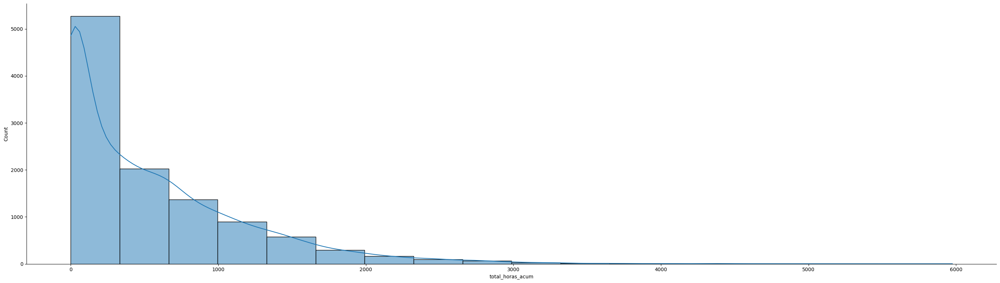

In [ ]:
# Para revisar la distribución de los datos
sns.displot(df_master, x="total_horas_acum", bins=18, kde=True, height=8, aspect=3.5)
plt.show()

In [ ]:
# Para saber la cardinalidad
df_master['total_horas_acum'].nunique()

2112

In [ ]:
# Para identificar sus medidas estadísticas
df_master['total_horas_acum'].describe()

,total_horas_acum
count,10844.000000
mean,553.556252
std,640.637312
min,0.000000
25%,23.000000
50%,353.500000
75%,846.000000
max,5975.000000


In [ ]:
# Para hacer el binning
df_master['total_horas_acum_bins'] = pd.cut(df_master["total_horas_acum"], bins=[0, 500, 1000, 2500, 5000, float('inf')], labels=['muy bajo', 'bajo', 'moderado', 'alto', 'intensivo'])

print("> Frecuencia del uso de unidades según sus horas acumuladas de operación 2024-2025\n")
print(df_master['total_horas_acum_bins'].value_counts(sort=True))

print("\n> Límites de los bins generados:\n")
print('* 0-500 horas: uso muy bajo')
print('* 500-1,000 horas: uso bajo')
print('* 1,000-2,500 horas: uso moderado')
print('* 2,500-5,000 horas: uso alto')
print('* 5,000 + horas: uso intensivo')

> Frecuencia del uso de unidades según sus horas acumuladas de operación 2024-2025

total_horas_acum_bins
muy bajo     4283
bajo         2355
moderado     1989
alto          164
intensivo       4
Name: count, dtype: int64

> Límites de los bins generados:

* 0-500 horas: uso muy bajo
* 500-1,000 horas: uso bajo
* 1,000-2,500 horas: uso moderado
* 2,500-5,000 horas: uso alto
* 5,000 + horas: uso intensivo


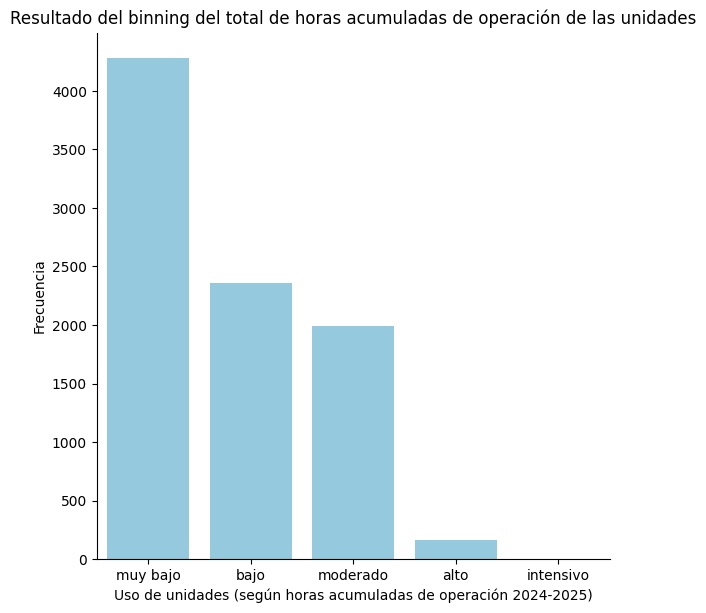

In [ ]:
# Comprobar el binning
sns.catplot(df_master, x='total_horas_acum_bins', kind='count', height=6, aspect=1, color='skyblue')
plt.title('Resultado del binning del total de horas acumuladas de operación de las unidades')
plt.xlabel('Uso de unidades (según horas acumuladas de operación 2024-2025)')
plt.ylabel('Frecuencia')
plt.show()

### **3.2 Discretización de `promedio_horas_mes`**


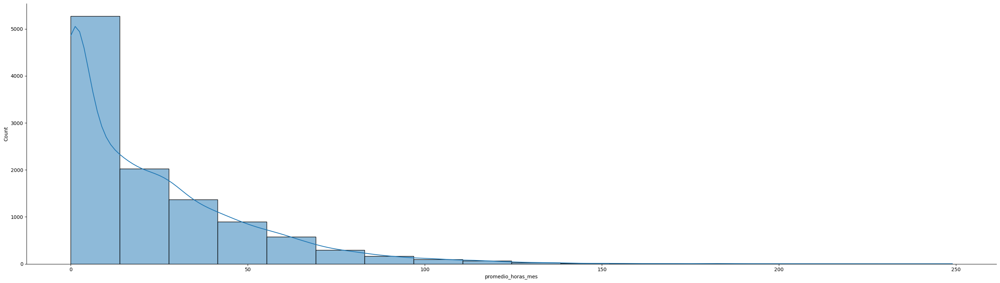

In [ ]:
# Para revisar la distribución de los datos
sns.displot(df_master, x="promedio_horas_mes", bins=18, kde=True, height=8, aspect=3.5)
plt.show()

In [ ]:
# Para saber la cardinalidad
df_master['promedio_horas_mes'].nunique()

2112

In [ ]:
# Para identificar sus medidas estadísticas
df_master['promedio_horas_mes'].describe()

,promedio_horas_mes
count,10844.000000
mean,23.064844
std,26.693221
min,0.000000
25%,0.958333
50%,14.729167
75%,35.250000
max,248.958333


In [ ]:
# Para hacer el binning
df_master['promedio_horas_mes_bins'] = pd.cut(df_master["promedio_horas_mes"], bins=[0, 60, 180, 320, float('inf')], labels=['bajo', 'moderado', 'alto', 'intensivo'])

print("> Promedio mensual del uso de unidades según sus horas acumuladas de operación 2024-2025\n")
print(df_master['total_horas_acum_bins'].value_counts(sort=True))

print("\n> Límites de los bins generados:\n")
print('* 0 - 60: uso bajo')
print('* 60 - 180: uso medio')
print('* 180 - 320: uso alto')
print('* 320 +: uso intensivo')

> Promedio mensual del uso de unidades según sus horas acumuladas de operación 2024-2025

total_horas_acum_bins
muy bajo     4283
bajo         2355
moderado     1989
alto          164
intensivo       4
Name: count, dtype: int64

> Límites de los bins generados:

* 0 - 60: uso bajo
* 60 - 180: uso medio
* 180 - 320: uso alto
* 320 +: uso intensivo


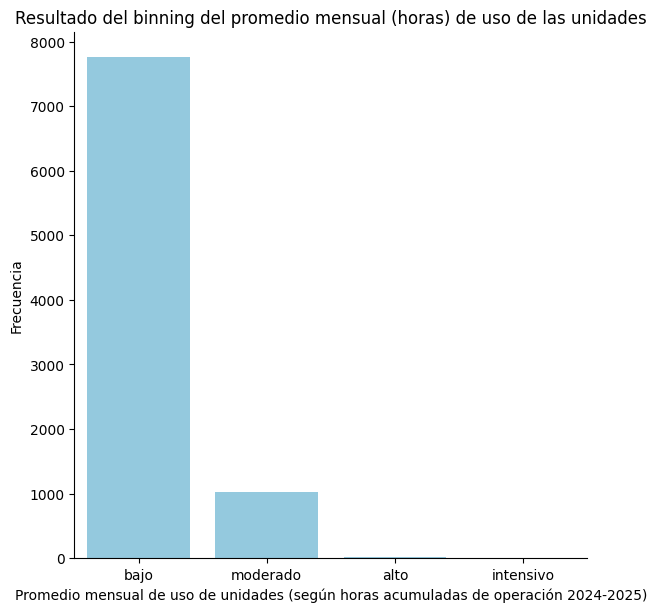

In [ ]:
# Comprobar el binning
sns.catplot(df_master, x='promedio_horas_mes_bins', kind='count', height=6, aspect=1, color='skyblue')
plt.title('Resultado del binning del promedio mensual (horas) de uso de las unidades')
plt.xlabel('Promedio mensual de uso de unidades (según horas acumuladas de operación 2024-2025)')
plt.ylabel('Frecuencia')
plt.show()

## **4.Utilizar one-hot encoding para las variables categóricas que consideren necesarias.**
---

Ejemplo: Para una columna de categorías como tipo de transporte, utilicen OneHotEncoder().fit_transform(df) para crear variables binarias.

In [ ]:
from sklearn.preprocessing import OneHotEncoder
#se selccionan varibles categoricas
categorical_cols = ['marca', 'distribuidor', 'estado', 'estatus']

# Crear una copia del DataFrame para evitar modificar erroneamente el original
df_encoded = df_master.copy()

#Se manejan los valores nulos
for col in categorical_cols:
    df_encoded[col] = df_encoded[col].fillna('Unknown')

# Inicio de One-Hot
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Transformacion y ajuste de las columnas
encoded_data = encoder.fit_transform(df_encoded[categorical_cols])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(categorical_cols))

df_encoded = df_encoded.drop(columns=categorical_cols)

df_encoded = pd.concat([df_encoded.reset_index(drop=True), encoded_df], axis=1)

print("--- Resultados del One-Hot Encoding ---")
print(f"Forma del DataFrame original (df_master): {df_master.shape}")
print(f"Forma del DataFrame después de One-Hot Encoding (df_encoded): {df_encoded.shape}")

print("\nPrimeras 5 filas del DataFrame con variables One-Hot Encoded:")
print(df_encoded.head())

print("\nEjemplo de las nuevas columnas One-Hot Encoded (primeras 5 filas para 'marca', 'distribuidor', 'estado', 'estatus'):")
print(df_encoded.filter(like='marca_').head())
print(df_encoded.filter(like='distribuidor_').head())
print(df_encoded.filter(like='estado_').head())
print(df_encoded.filter(like='estatus_').head())

--- Resultados del One-Hot Encoding ---
Forma del DataFrame original (df_master): (10844, 75)
Forma del DataFrame después de One-Hot Encoding (df_encoded): (10844, 159)

Primeras 5 filas del DataFrame con variables One-Hot Encoded:
              alias          modelo fecha_alta            no_serie  \
0   08-P018766-TT75            TT75 2021-07-19   T48920M-715245417   
1   08-P023148-TT75            TT75 2021-07-19  T049436M-715300029   
2         155TAYLOR  7610S HERENCIA 2021-07-19             S56577M   
3    16397000062879             NaN        NaT                 NaN   
4  179566./MAD. SUR           6610S 2021-07-19     S34560M-8033509   

                                              ciudad  horometro  odometro  \
0                                 Hidalgo del Parral    2400.98      3.44   
1                                 Hidalgo del Parral    2897.01     30.13   
2  Dolores Hidalgo Cuna de la Independencia Nacional    1889.95     85.97   
3                                      

## **5. Ejecutar las transformaciones apropiadas para las variables con valores atípicos identificados.**

---
Ejemplo: Si identifican valores atípicos en una columna de costos, consideren aplicar una transformación logarítmica o eliminar esos registros.

### Diagnóstico de distribución de las variables continuas y discretas
Para este paso se usará la funcion `diagnostico_transformacion` asi como un par de funciones de apoyo para visualizar los datos (histogramas, box plot y qqplot), de forma que sea posible determinar cuál es la mejor transformación de las variables, teniendo en cuenta dicha observación, el skewness, curtosis y el contexto de las variables.

In [ ]:
import scipy.stats as stats

def _calcular_outliers_iqr(serie):
    """
    Devuelve cantidad y porcentaje de outliers usando IQR.
    """
    q1 = serie.quantile(0.25)
    q3 = serie.quantile(0.75)
    iqr = q3 - q1

    limite_inferior = q1 - 1.5 * iqr
    limite_superior = q3 + 1.5 * iqr

    outliers = serie[(serie < limite_inferior) | (serie > limite_superior)]

    cantidad = len(outliers)
    porcentaje = (cantidad / len(serie)) * 100 if len(serie) > 0 else 0

    return cantidad, porcentaje

def _es_columna_continua(serie, umbral_unicos=10):
    """
    Devuelve True si la columna es numérica continua (no OHE ni categórica codificada).
    Criterios:
      - Más de `umbral_unicos` valores distintos
      - No es estrictamente binaria (solo 0 y 1)
    """
    valores_unicos = serie.dropna().unique()

    # Excluir binarias (OHE clásico)
    if set(valores_unicos).issubset({0, 1}):
        return False

    # Excluir columnas con muy pocos valores únicos (categóricas disfrazadas)
    if serie.nunique() <= umbral_unicos:
        return False

    return True

def diagnostico_transformacion(df, columnas=None):
    """
    Genera un panel de 4 gráficas por columna para diagnosticar
    qué transformación aplicar:
    - Histograma + KDE
    - Boxplot
    - QQ-Plot
    - Comparativa de skewness con distintas transformaciones
    """
    contador = 0
    if columnas is None:
        columnas_numericas = df.select_dtypes(include=[np.number]).columns.tolist()
        # filtrar solo columnas continuas
        columnas = [
            col for col in columnas_numericas
            if _es_columna_continua(df[col])
        ]
        #Se ordenan las columnas al mostrarse las graficas
        columnas = sorted(columnas)

        excluidas = set(columnas_numericas) - set(columnas)
        if excluidas:
            print(f"⚠️  Columnas omitidas (binarias / pocas categorías): {sorted(excluidas)}\n")


    for col in columnas:
        serie = df[col].dropna()
        skew  = serie.skew()
        kurt  = serie.kurt()
        outliers_count, outliers_pct = _calcular_outliers_iqr(serie)

        fig, axes = plt.subplots(1, 4, figsize=(20, 4))
        fig.suptitle(
            f'Diagnóstico: {col} | skew={skew:.2f} | kurt={kurt:.2f} | outliers={outliers_count} ({outliers_pct:.1f}%)',
            fontsize=13, fontweight='bold'
            )

        # --- 1. Histograma + KDE ---
        axes[0].hist(serie, bins=30, color='steelblue',
                     edgecolor='white', density=True, alpha=0.7)
        serie.plot(kind='kde', ax=axes[0], color='tomato', linewidth=2)
        axes[0].set_title('Histograma + KDE')
        axes[0].set_xlabel(col)
        axes[0].axvline(serie.mean(),   color='orange', linestyle='--',
                        linewidth=1.5, label=f'Media={serie.mean():.1f}')
        axes[0].axvline(serie.median(), color='green',  linestyle='--',
                        linewidth=1.5, label=f'Mediana={serie.median():.1f}')
        axes[0].legend(fontsize=8)

        # --- 2. Boxplot ---
        axes[1].boxplot(serie, vert=True, patch_artist=True,
                        boxprops=dict(facecolor='steelblue', alpha=0.7),
                        medianprops=dict(color='tomato', linewidth=2))
        axes[1].set_title('Boxplot')
        axes[1].set_ylabel(col)

        # --- 3. QQ-Plot ---
        stats.probplot(serie, dist='norm', plot=axes[2])
        axes[2].set_title('QQ-Plot vs Normal')
        axes[2].get_lines()[0].set(color='steelblue', markersize=4, alpha=0.6)
        axes[2].get_lines()[1].set(color='tomato', linewidth=2)

        # --- 4. Comparativa de skewness ---
        transformaciones = {'Original': serie}

        if serie.min() >= 0:
            transformaciones['log1p'] = np.log1p(serie)
            transformaciones['sqrt']  = np.sqrt(serie)
        if serie.min() > 0:
            transformaciones['box-cox'] = pd.Series(
                stats.boxcox(serie)[0], index=serie.index
            )

        from sklearn.preprocessing import PowerTransformer
        pt = PowerTransformer(method='yeo-johnson')
        transformaciones['yeo-johnson'] = pd.Series(
            pt.fit_transform(serie.values.reshape(-1, 1)).flatten(),
            index=serie.index
        )

        nombres = list(transformaciones.keys())
        skews   = [abs(t.skew()) for t in transformaciones.values()]
        colores = ['tomato' if n == 'Original'
                   else 'mediumseagreen' if skews[i] == min(skews[1:])
                   else 'steelblue'
                   for i, n in enumerate(nombres)]

        bars = axes[3].bar(nombres, skews, color=colores, edgecolor='white')
        axes[3].set_title('|Skewness| por transformación\n(menor = mejor)')
        axes[3].set_ylabel('|Skewness|')
        axes[3].axhline(0.5, color='orange', linestyle='--',
                        linewidth=1.5, label='Umbral aceptable (0.5)')
        axes[3].legend(fontsize=8)

        # Etiquetas en las barras
        for bar, skew_val in zip(bars, skews):
            axes[3].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.02,
                f'{skew_val:.2f}',
                ha='center', va='bottom', fontsize=9
            )

        plt.tight_layout()
        plt.show()

        # --- Recomendación en texto ---
        mejor = nombres[skews.index(min(skews[1:]))]
        print(f"\n🔍 Columna: '{col}'")
        print(f"   Skewness original : {serie.skew():.2f}")
        print(f"   Kurtosis original : {serie.kurt():.2f}")
        print(f"   Outliers detectados: {outliers_count} ({outliers_pct:.2f}%)")
        _interpretar(serie.skew(), mejor)
        print("-" * 50)
        contador += 1
    print(f"Columnas graficadas {contador} columnas")
    print(f"Columnas: {columnas}" )

El siguiente código ofrece una recomendación automatizada dependiendo solamente del nivel de skewness y curtosis. Esto solamente puede usarse como una guía debido a que se tiene que tomar el contexto de cada variable para determinar su transformación correcta.

In [ ]:
def _interpretar(skew, mejor_transformacion):
    """Imprime una recomendación legible según el skewness."""

    if abs(skew) < 0.5:
        print("   ✅ Distribución casi normal, probablemente no necesita transformar los datos.")
    elif skew > 1:
        print(f"   🔴 Sesgo positivo fuerte — cola larga a la derecha.")
        print(f"   👉 Transformación recomendada: {mejor_transformacion}")
        print(f"      (considerar también winsorización si hay outliers extremos)")
    elif skew > 0.5:
        print(f"   🟡 Sesgo positivo moderado.")
        print(f"   👉 Transformación recomendada: {mejor_transformacion}")
    elif skew < -1:
        print(f"   🔴 Sesgo negativo fuerte — cola larga a la izquierda.")
        print(f"   👉 Transformación recomendada: {mejor_transformacion}")
        print(f"      (Yeo-Johnson suele funcionar mejor para sesgos negativos)")
    elif skew < -0.5:
        print(f"   🟡 Sesgo negativo moderado.")
        print(f"   👉 Transformación recomendada: {mejor_transformacion}")

Llamamos las funciones para ver los gráficos e interpretaciones recomendadas.

⚠️  Columnas omitidas (binarias / pocas categorías): ['distribuidor_ADMIN.VRM', 'distribuidor_AGROCISAGRAL', 'distribuidor_AGROEQUIPOS', 'distribuidor_AGROINDUSTRIALES', 'distribuidor_AGROSURTE', 'distribuidor_ALTENOS', 'distribuidor_ARAMBULA', 'distribuidor_ARBSA', 'distribuidor_ATC', 'distribuidor_ATN', 'distribuidor_ATS', 'distribuidor_BLACKTORO', 'distribuidor_BOSQUES', 'distribuidor_CAPASA', 'distribuidor_CUMMINSBAJA', 'distribuidor_DASSA', 'distribuidor_DIMAPESA', 'distribuidor_EMEJORES', 'distribuidor_ENAGRI', 'distribuidor_FORTEX', 'distribuidor_IAFSA', 'distribuidor_JORDAN', 'distribuidor_MADISAGRAL', 'distribuidor_MAQUINTER', 'distribuidor_MAQUIRENT', 'distribuidor_MTM', 'distribuidor_NORTRACK', 'distribuidor_RIVERO', 'distribuidor_SAMSA', 'distribuidor_TAPSA', 'distribuidor_TEPSA', 'distribuidor_TRACSAGRAL', 'distribuidor_TRACTIESA', 'distribuidor_TRIOSA', 'distribuidor_Unknown', 'distribuidor_altenos', 'estado_Aguascalientes', 'estado_Baja California', 'estado_Baja Californ

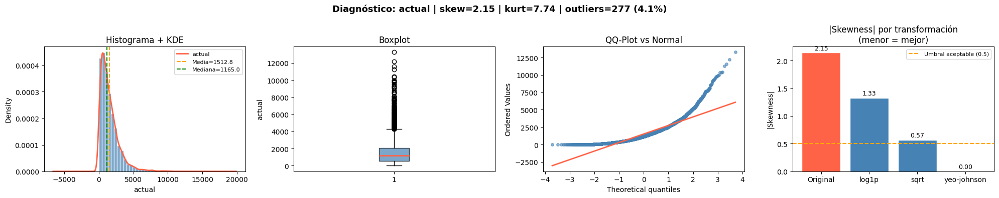


🔍 Columna: 'actual'
   Skewness original : 2.15
   Kurtosis original : 7.74
   Outliers detectados: 277 (4.09%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


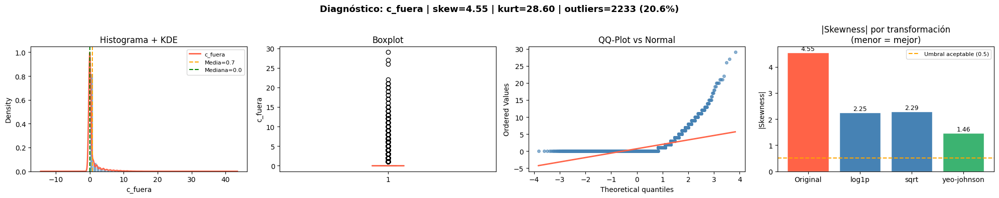


🔍 Columna: 'c_fuera'
   Skewness original : 4.55
   Kurtosis original : 28.60
   Outliers detectados: 2233 (20.59%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


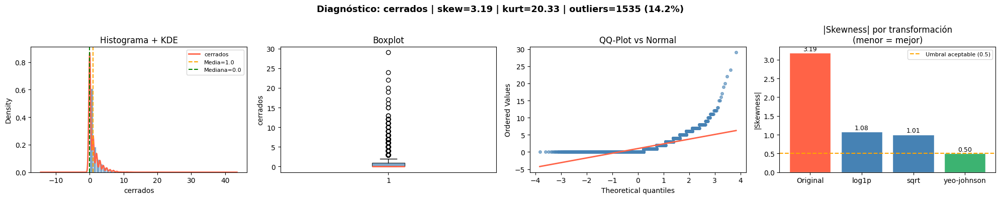


🔍 Columna: 'cerrados'
   Skewness original : 3.19
   Kurtosis original : 20.33
   Outliers detectados: 1535 (14.16%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


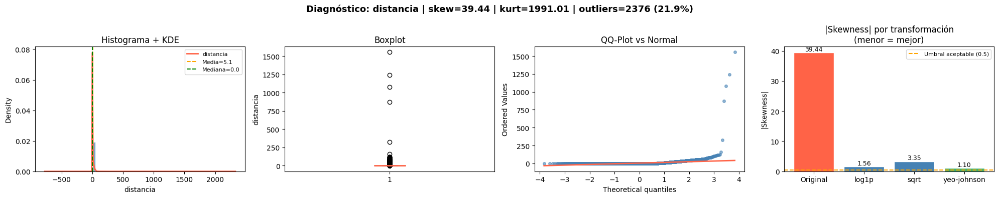


🔍 Columna: 'distancia'
   Skewness original : 39.44
   Kurtosis original : 1991.01
   Outliers detectados: 2376 (21.91%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


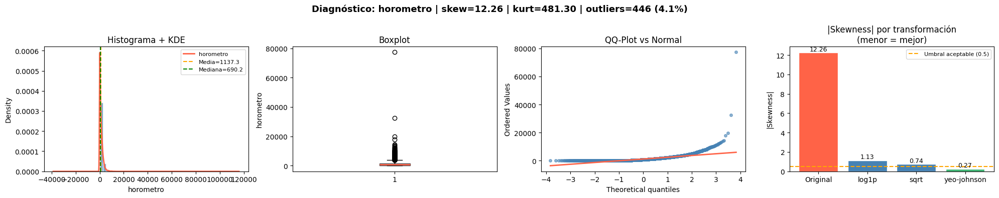


🔍 Columna: 'horometro'
   Skewness original : 12.26
   Kurtosis original : 481.30
   Outliers detectados: 446 (4.11%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


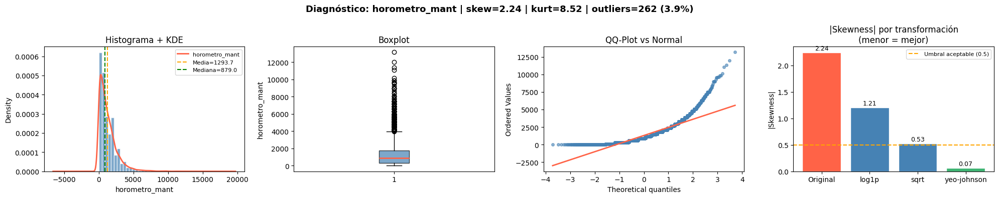


🔍 Columna: 'horometro_mant'
   Skewness original : 2.24
   Kurtosis original : 8.52
   Outliers detectados: 262 (3.87%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


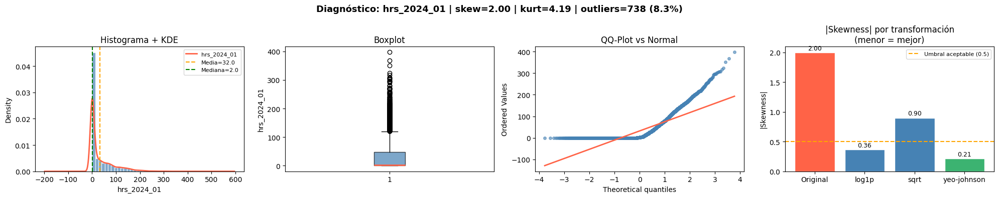


🔍 Columna: 'hrs_2024_01'
   Skewness original : 2.00
   Kurtosis original : 4.19
   Outliers detectados: 738 (8.31%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


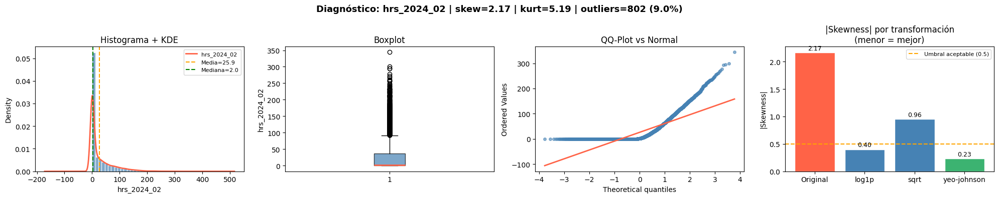


🔍 Columna: 'hrs_2024_02'
   Skewness original : 2.17
   Kurtosis original : 5.19
   Outliers detectados: 802 (9.03%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


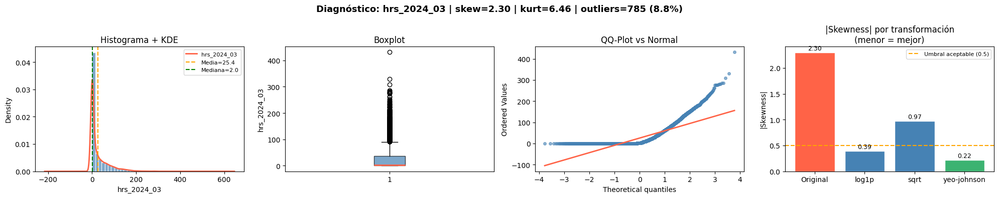


🔍 Columna: 'hrs_2024_03'
   Skewness original : 2.30
   Kurtosis original : 6.46
   Outliers detectados: 785 (8.84%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


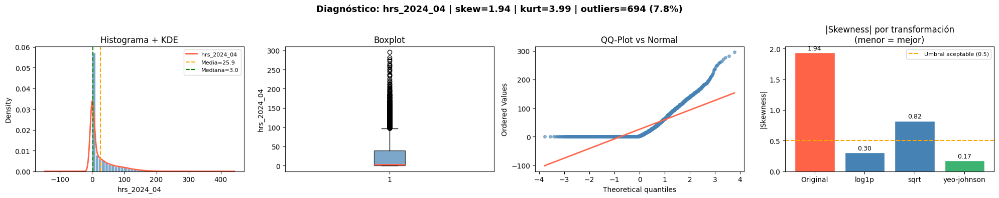


🔍 Columna: 'hrs_2024_04'
   Skewness original : 1.94
   Kurtosis original : 3.99
   Outliers detectados: 694 (7.82%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


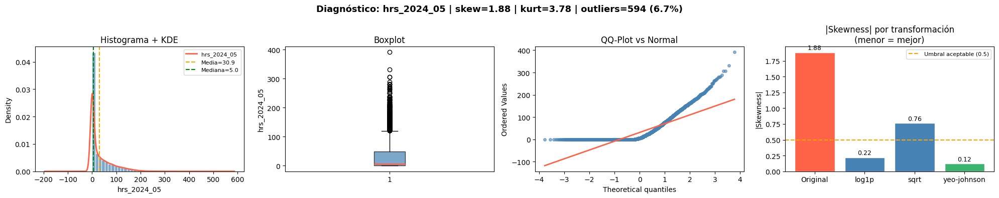


🔍 Columna: 'hrs_2024_05'
   Skewness original : 1.88
   Kurtosis original : 3.78
   Outliers detectados: 594 (6.69%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


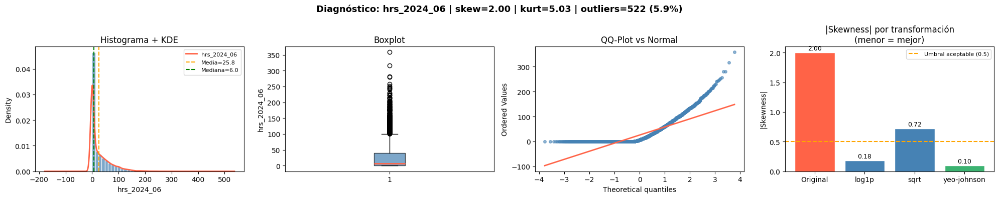


🔍 Columna: 'hrs_2024_06'
   Skewness original : 2.00
   Kurtosis original : 5.03
   Outliers detectados: 522 (5.88%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


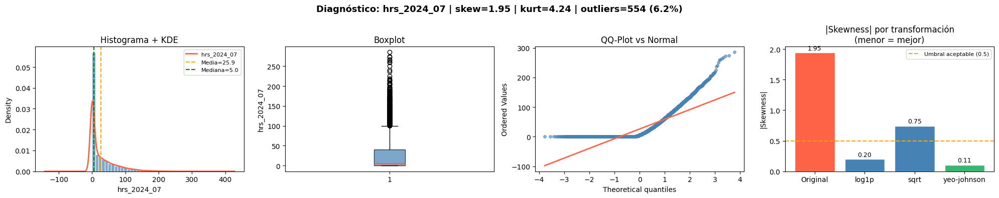


🔍 Columna: 'hrs_2024_07'
   Skewness original : 1.95
   Kurtosis original : 4.24
   Outliers detectados: 554 (6.24%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


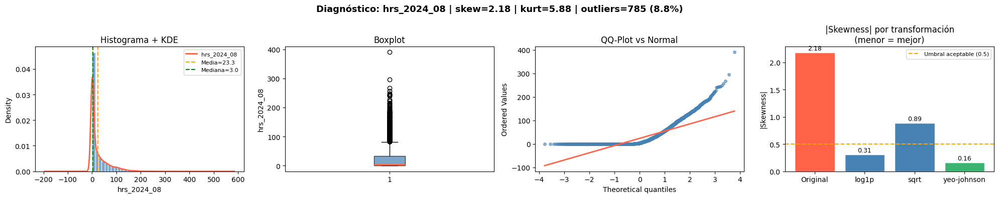


🔍 Columna: 'hrs_2024_08'
   Skewness original : 2.18
   Kurtosis original : 5.88
   Outliers detectados: 785 (8.84%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


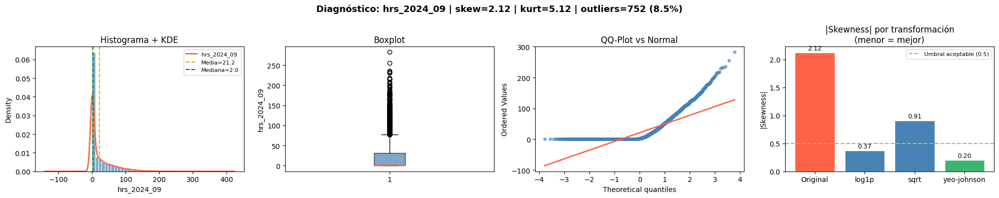


🔍 Columna: 'hrs_2024_09'
   Skewness original : 2.12
   Kurtosis original : 5.12
   Outliers detectados: 752 (8.47%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


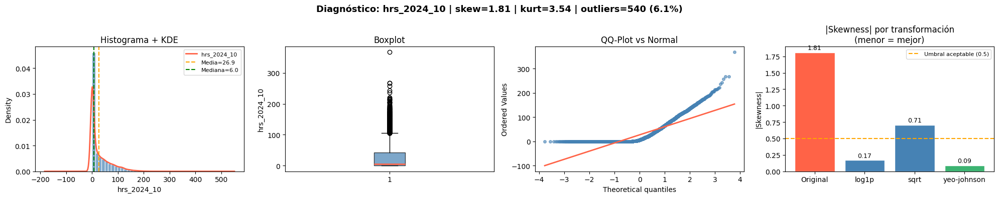


🔍 Columna: 'hrs_2024_10'
   Skewness original : 1.81
   Kurtosis original : 3.54
   Outliers detectados: 540 (6.08%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


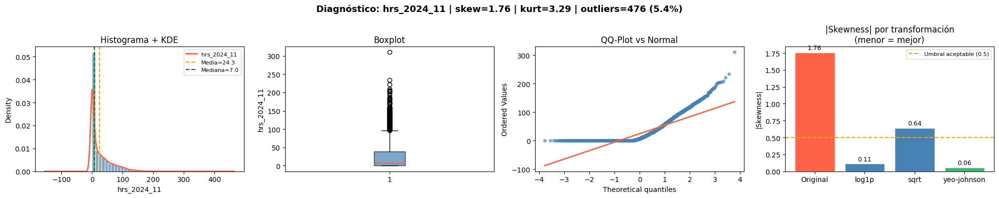


🔍 Columna: 'hrs_2024_11'
   Skewness original : 1.76
   Kurtosis original : 3.29
   Outliers detectados: 476 (5.36%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


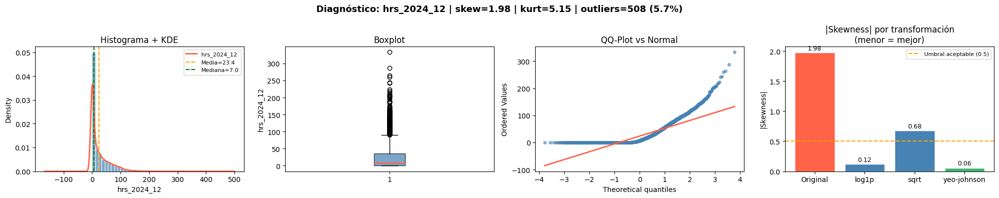


🔍 Columna: 'hrs_2024_12'
   Skewness original : 1.98
   Kurtosis original : 5.15
   Outliers detectados: 508 (5.72%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


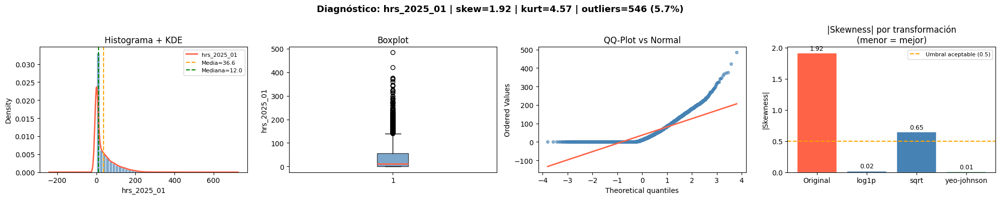


🔍 Columna: 'hrs_2025_01'
   Skewness original : 1.92
   Kurtosis original : 4.57
   Outliers detectados: 546 (5.68%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


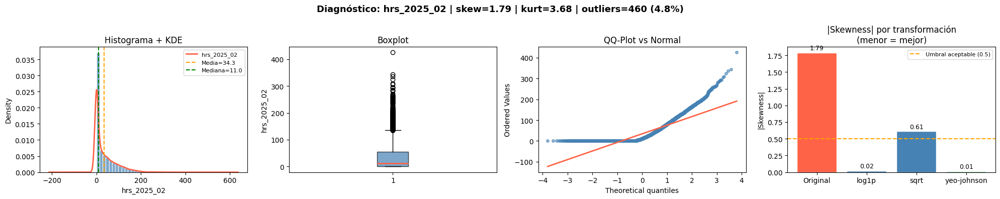


🔍 Columna: 'hrs_2025_02'
   Skewness original : 1.79
   Kurtosis original : 3.68
   Outliers detectados: 460 (4.79%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


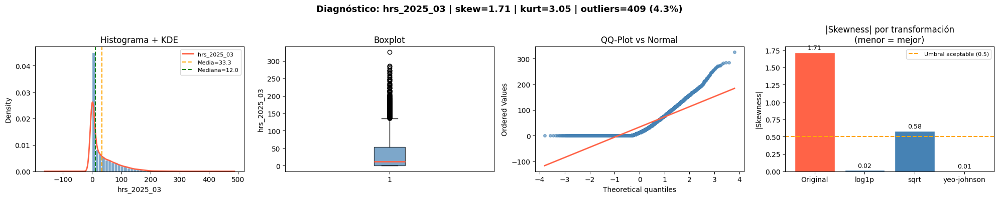


🔍 Columna: 'hrs_2025_03'
   Skewness original : 1.71
   Kurtosis original : 3.05
   Outliers detectados: 409 (4.26%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


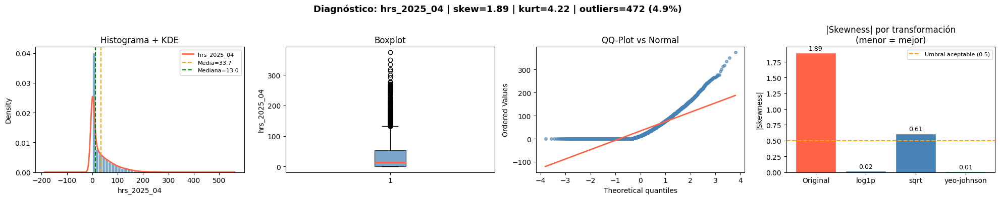


🔍 Columna: 'hrs_2025_04'
   Skewness original : 1.89
   Kurtosis original : 4.22
   Outliers detectados: 472 (4.91%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


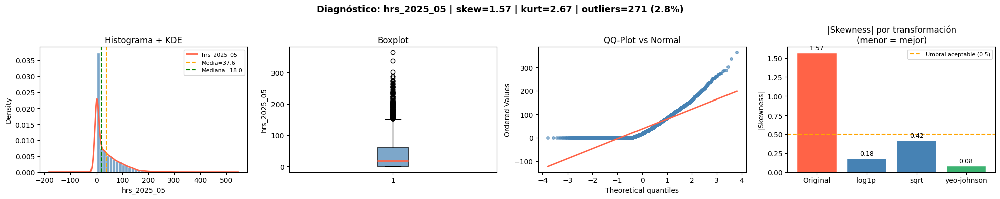


🔍 Columna: 'hrs_2025_05'
   Skewness original : 1.57
   Kurtosis original : 2.67
   Outliers detectados: 271 (2.82%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


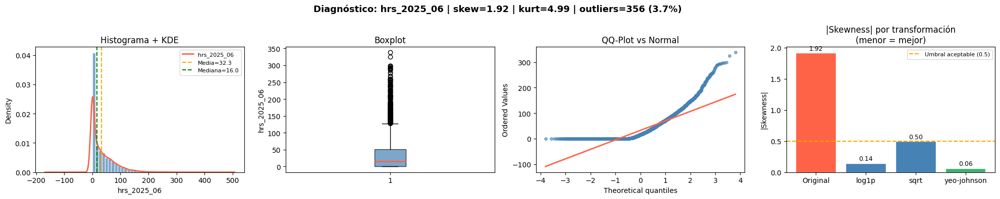


🔍 Columna: 'hrs_2025_06'
   Skewness original : 1.92
   Kurtosis original : 4.99
   Outliers detectados: 356 (3.71%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


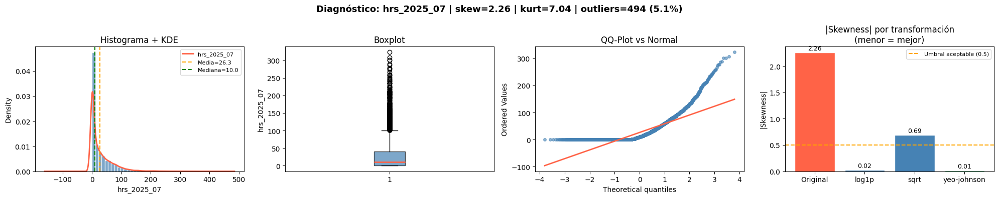


🔍 Columna: 'hrs_2025_07'
   Skewness original : 2.26
   Kurtosis original : 7.04
   Outliers detectados: 494 (5.14%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


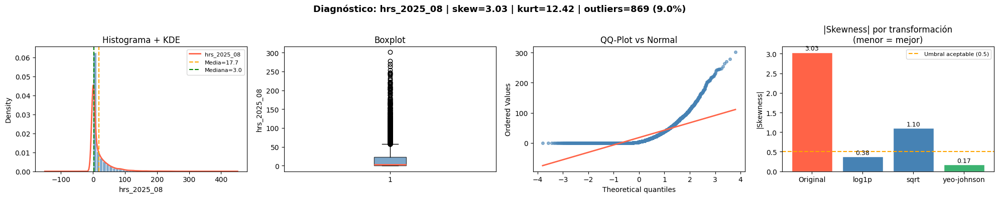


🔍 Columna: 'hrs_2025_08'
   Skewness original : 3.03
   Kurtosis original : 12.42
   Outliers detectados: 869 (9.05%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


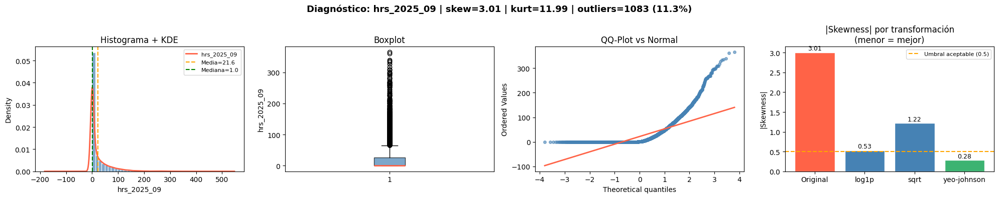


🔍 Columna: 'hrs_2025_09'
   Skewness original : 3.01
   Kurtosis original : 11.99
   Outliers detectados: 1083 (11.28%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


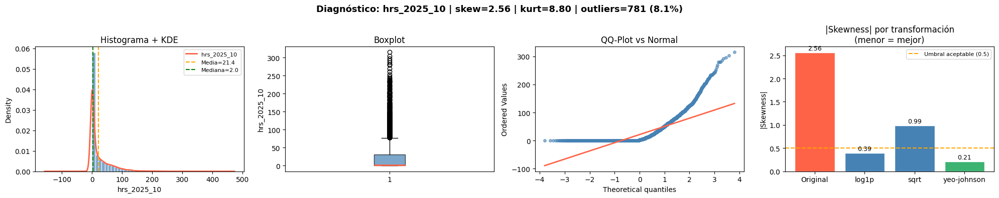


🔍 Columna: 'hrs_2025_10'
   Skewness original : 2.56
   Kurtosis original : 8.80
   Outliers detectados: 781 (8.13%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


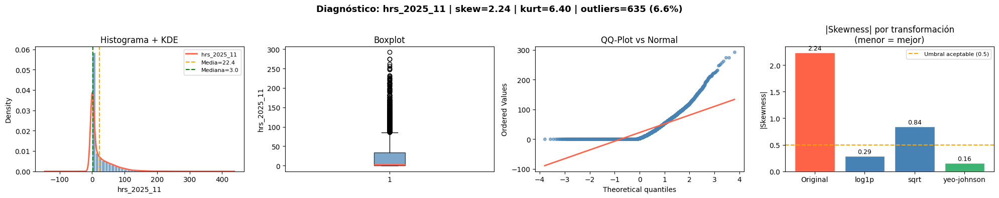


🔍 Columna: 'hrs_2025_11'
   Skewness original : 2.24
   Kurtosis original : 6.40
   Outliers detectados: 635 (6.61%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


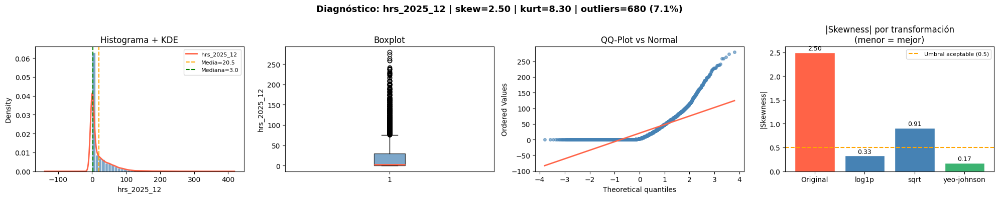


🔍 Columna: 'hrs_2025_12'
   Skewness original : 2.50
   Kurtosis original : 8.30
   Outliers detectados: 680 (7.08%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


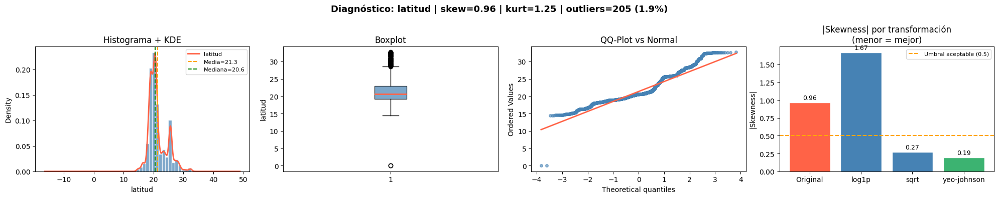


🔍 Columna: 'latitud'
   Skewness original : 0.96
   Kurtosis original : 1.25
   Outliers detectados: 205 (1.93%)
   🟡 Sesgo positivo moderado.
   👉 Transformación recomendada: yeo-johnson
--------------------------------------------------


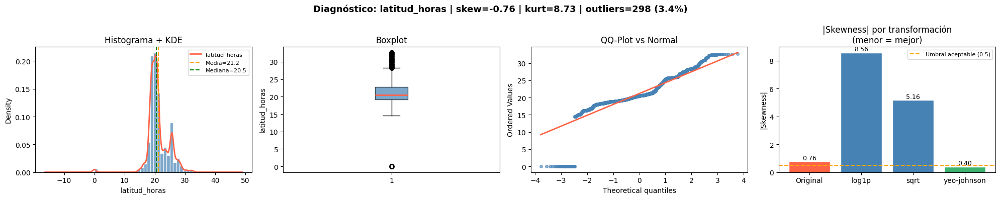


🔍 Columna: 'latitud_horas'
   Skewness original : -0.76
   Kurtosis original : 8.73
   Outliers detectados: 298 (3.36%)
   🟡 Sesgo negativo moderado.
   👉 Transformación recomendada: yeo-johnson
--------------------------------------------------


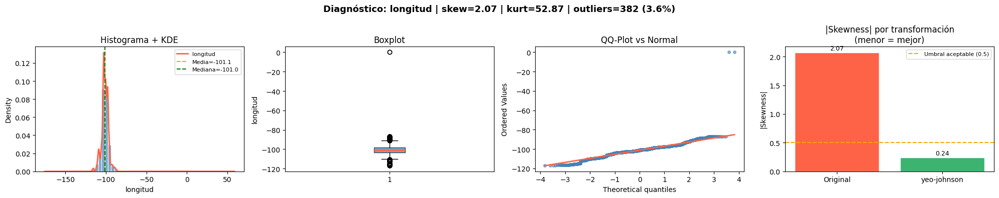


🔍 Columna: 'longitud'
   Skewness original : 2.07
   Kurtosis original : 52.87
   Outliers detectados: 382 (3.60%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


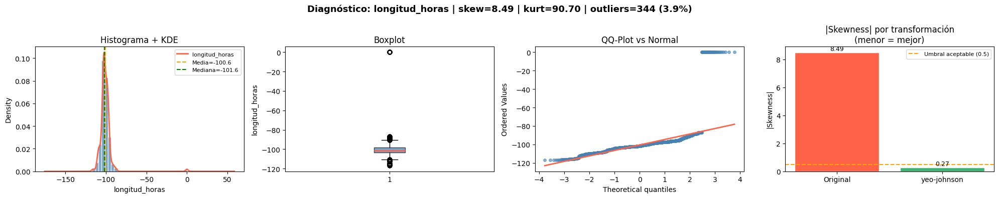


🔍 Columna: 'longitud_horas'
   Skewness original : 8.49
   Kurtosis original : 90.70
   Outliers detectados: 344 (3.87%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


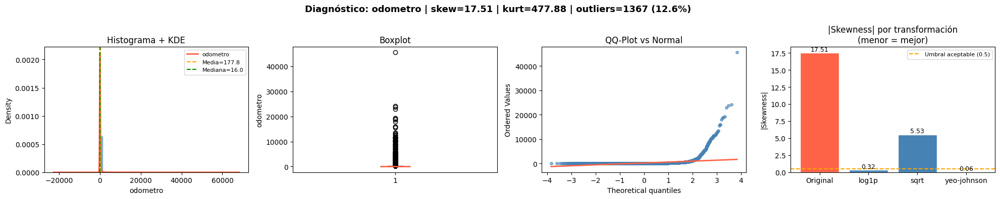


🔍 Columna: 'odometro'
   Skewness original : 17.51
   Kurtosis original : 477.88
   Outliers detectados: 1367 (12.61%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


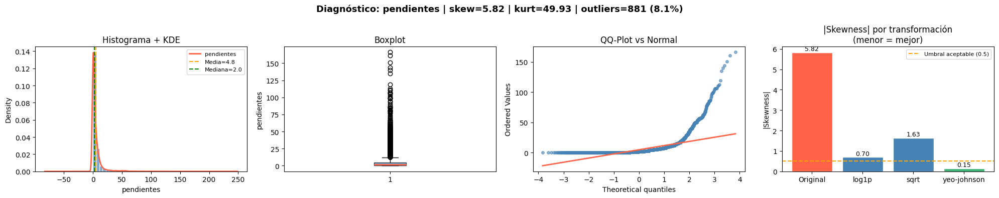


🔍 Columna: 'pendientes'
   Skewness original : 5.82
   Kurtosis original : 49.93
   Outliers detectados: 881 (8.12%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


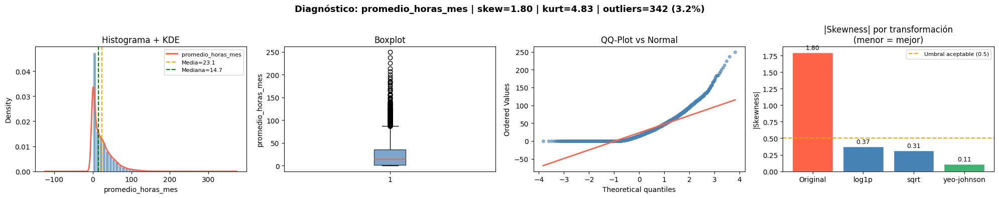


🔍 Columna: 'promedio_horas_mes'
   Skewness original : 1.80
   Kurtosis original : 4.83
   Outliers detectados: 342 (3.15%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


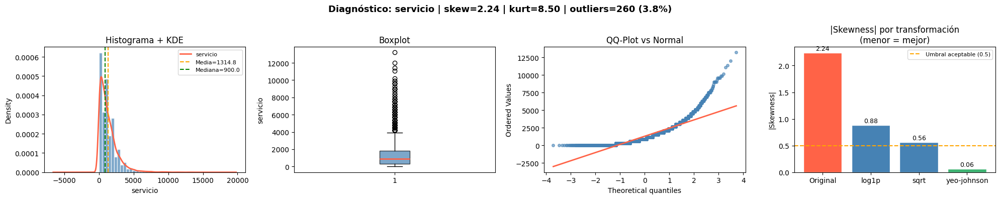


🔍 Columna: 'servicio'
   Skewness original : 2.24
   Kurtosis original : 8.50
   Outliers detectados: 260 (3.84%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


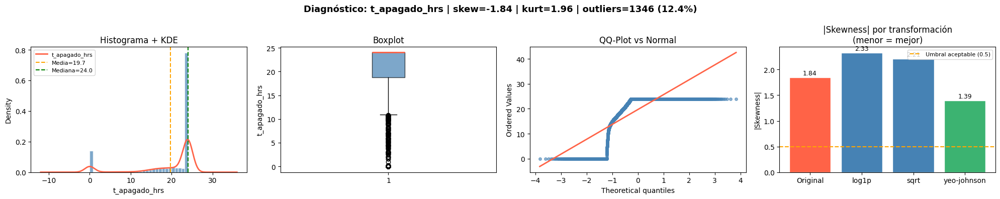


🔍 Columna: 't_apagado_hrs'
   Skewness original : -1.84
   Kurtosis original : 1.96
   Outliers detectados: 1346 (12.41%)
   🔴 Sesgo negativo fuerte — cola larga a la izquierda.
   👉 Transformación recomendada: yeo-johnson
      (Yeo-Johnson suele funcionar mejor para sesgos negativos)
--------------------------------------------------


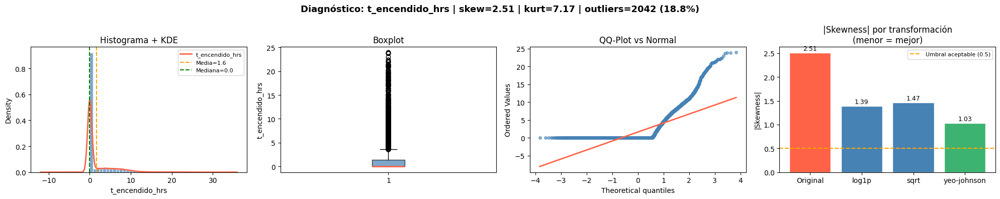


🔍 Columna: 't_encendido_hrs'
   Skewness original : 2.51
   Kurtosis original : 7.17
   Outliers detectados: 2042 (18.83%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


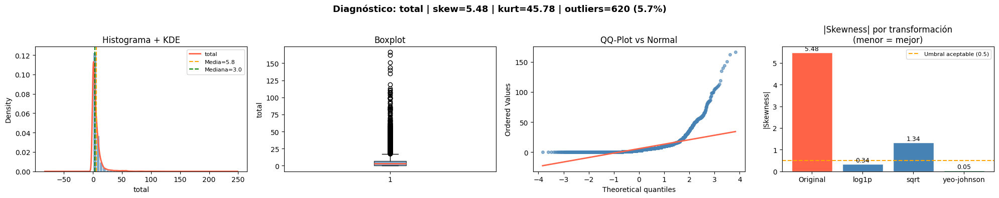


🔍 Columna: 'total'
   Skewness original : 5.48
   Kurtosis original : 45.78
   Outliers detectados: 620 (5.72%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


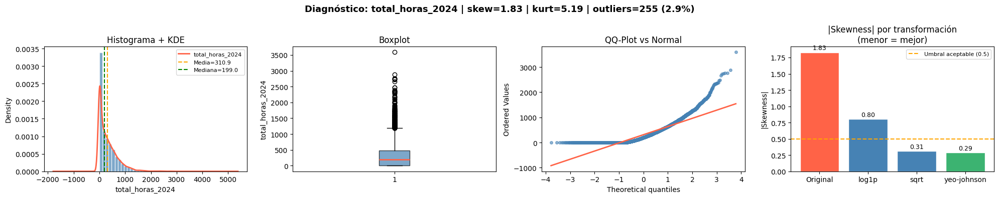


🔍 Columna: 'total_horas_2024'
   Skewness original : 1.83
   Kurtosis original : 5.19
   Outliers detectados: 255 (2.87%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


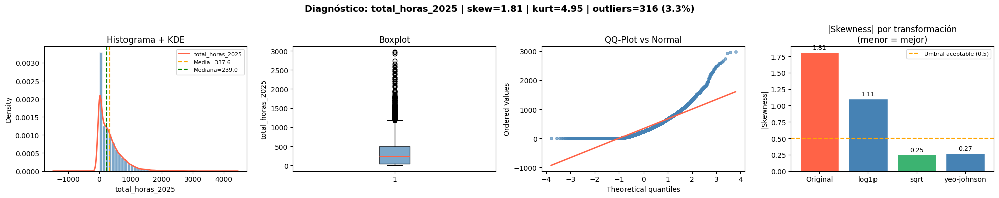


🔍 Columna: 'total_horas_2025'
   Skewness original : 1.81
   Kurtosis original : 4.95
   Outliers detectados: 316 (3.29%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: sqrt
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


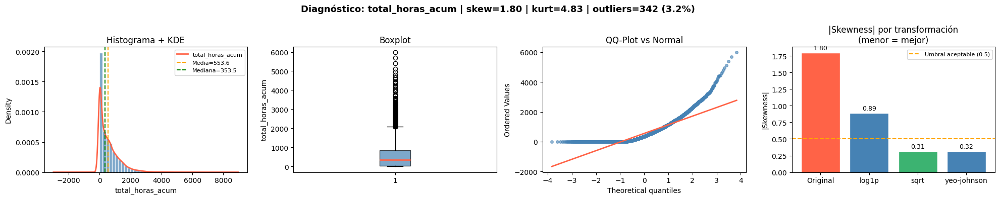


🔍 Columna: 'total_horas_acum'
   Skewness original : 1.80
   Kurtosis original : 4.83
   Outliers detectados: 342 (3.15%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: sqrt
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


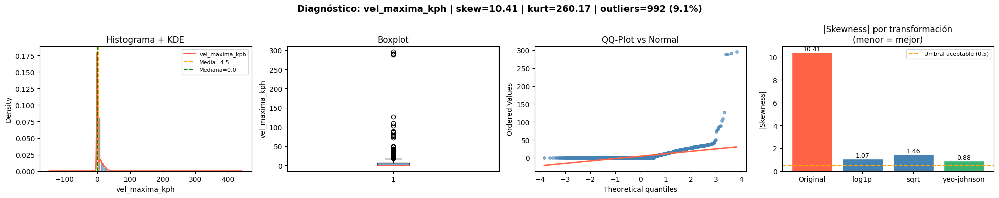


🔍 Columna: 'vel_maxima_kph'
   Skewness original : 10.41
   Kurtosis original : 260.17
   Outliers detectados: 992 (9.15%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


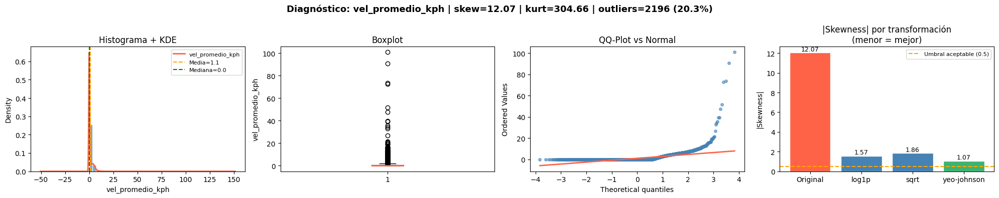


🔍 Columna: 'vel_promedio_kph'
   Skewness original : 12.07
   Kurtosis original : 304.66
   Outliers detectados: 2196 (20.25%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------
Columnas graficadas 46 columnas
Columnas: ['actual', 'c_fuera', 'cerrados', 'distancia', 'horometro', 'horometro_mant', 'hrs_2024_01', 'hrs_2024_02', 'hrs_2024_03', 'hrs_2024_04', 'hrs_2024_05', 'hrs_2024_06', 'hrs_2024_07', 'hrs_2024_08', 'hrs_2024_09', 'hrs_2024_10', 'hrs_2024_11', 'hrs_2024_12', 'hrs_2025_01', 'hrs_2025_02', 'hrs_2025_03', 'hrs_2025_04', 'hrs_2025_05', 'hrs_2025_06', 'hrs_2025_07', 'hrs_2025_08', 'hrs_2025_09', 'hrs_2025_10', 'hrs_2025_11', 'hrs_2025_12', 'latitud', 'latitud_horas', 'longitud', 'longitud_horas', 'odometro', 'pendientes', 'promedio_horas_mes', 'servicio', 't_apagado_hrs', 't_encendido_hrs', 'total', 'total_horas_

In [ ]:

df_encoded['imei'] = pd.to_numeric(df_encoded['imei'], errors='coerce')
df_encoded['imei'] = df_encoded['imei'].astype('Int64').astype(str)
df_encoded['id_tractor'] = pd.to_numeric(df_encoded['id_tractor'], errors='coerce')
df_encoded['id_tractor'] = df_encoded['id_tractor'].astype('Int64').astype(str)
diagnostico_transformacion(df_encoded)



#### **Observaciones**
1. Con el skewness y curtosis, podemos confirmar que ninguna gráfica tiene una distribución normal, debido a que todos tienen un skewness y curtosis fuera de los rangos -0.5 y 0.5 (a excepción de la variable `latitud`).

2. La gráfica de QQ-plot nos permite ver que las variables `longitud` y `longitud_horas` tienen los datos que más se ajustan a la línea de la normal, pero que no se ajustan del todo debido a los outliers de estas variables, lo anterior puede ser confirmada al observar los boxplots y los outliers detectados(3.6% para `longitud` y 3.87% para `longitud_horas`). Estos porcentajes de outliers pueden considerarse normal, pero no descarta la posibilidad de tener que segmentar estos datos para poder usarlos con modelos de machine learning. En el caso de estas variables, no se harán transformaciones adicionales.

3. Este mismo caso de outliers extremos se puede observar en la variable de `horometro`, la cual nos dice que hay unidades que registraron más de 25,000 horas, lo que equivale a más de 5 años de trabajo continuo con jornadas de 12 horas, lo cual parece inverosímil teniendo en cuenta que los registros de unidades empezaron en 2021. Esto parece ser un caso de variables mal recolectadas, por lo que procederemos a eliminar aquellos registros en `horometro` que excedan las 25,000 horas.


4. Para la variable `vel_maxima_kph` podemos observar que hay registros con kilometros x hora mayor a 100kph, lo cual es imposible teniendo en cuenta que la velocidad máxima de un tractor oscila entre los 40 y 50kph. En la variable `vel_promedio_kph` existe un 20% de outliers, que comparándola con el QQplot, nos dice que dichos outliers son un comportamiento real de los datos y no errores en la recolección de datos. En este caso particular no se asume una distribución normal, por lo que dejamos estas variables sin transformar.

5. Se observa que las variables `actual`, `c_fuera`, `cerrados`, `distancia`, `horometro_mant`, `hrs_2024_01`, `hrs_2024_02`, `hrs_2024_03`, `hrs_2024_04`, `hrs_2024_05`, `hrs_2024_06`, `hrs_2024_07`, `hrs_2024_08`, `hrs_2024_09`, `hrs_2024_10`, `hrs_2024_11`, `hrs_2024_12`, `hrs_2025_01`', `hrs_2025_02`, `hrs_2025_03`, `hrs_2025_04`, `hrs_2025_05`, `hrs_2025_06`, `hrs_2025_07`, `hrs_2025_08`, `hrs_2025_09`, `hrs_2025_10`, `hrs_2025_11`, `hrs_2025_12`, `latitud_horas`, `odometro`, `pendientes`, `promedio_horas_mes`, `servicio`, `t_apagado_hrs`, `t_encendido_hrs`, `total`, `total_horas_2024`, `total_horas_2025` y `total_horas_acum` tienen un sesgo positivo y menos de 20% de outliers, por lo que utilizaremos la transformacion Yeo-Johnson para hacer que los datos se asemejen a una distribucion normal. Lo anterior debido a que permite trabajar con valores de 0.


**Nota: Aun no aplicaremos winzorizacion hasta ver las transformaciones para estas columnas**

### Hacemos la transformación para las columnas seleccionadas.
El siguiente código muestra la implementación para transformar las columnas del dataframe.

In [ ]:

#Convertimos estas columnas de ID de regreso a strings para evitar que se detecten al hacer los diagnosticos
df_encoded['imei'] = pd.to_numeric(df_encoded['imei'], errors='coerce')
df_encoded['imei'] = df_encoded['imei'].astype('Int64').astype(str)
df_encoded['id_tractor'] = pd.to_numeric(df_encoded['id_tractor'], errors='coerce')
df_encoded['id_tractor'] = df_encoded['id_tractor'].astype('Int64').astype(str)

Aplicamos la función de transformación y vemos el resumen de los cambios realizados a las columnas

In [ ]:
#Se limpia la columna horometro con el analisis anterior
df_encoded = df_encoded[df_encoded['horometro'] <= 25000]

In [ ]:
#Juntamos las variables a transformar
columnas_transformar = [
    'actual', 'c_fuera', 'cerrados', 'distancia', 'horometro_mant',
    'hrs_2024_01', 'hrs_2024_02', 'hrs_2024_03', 'hrs_2024_04',
    'hrs_2024_05', 'hrs_2024_06', 'hrs_2024_07', 'hrs_2024_08',
    'hrs_2024_09', 'hrs_2024_10', 'hrs_2024_11', 'hrs_2024_12',
    'hrs_2025_01', 'hrs_2025_02', 'hrs_2025_03', 'hrs_2025_04',
    'hrs_2025_05', 'hrs_2025_06', 'hrs_2025_07', 'hrs_2025_08',
    'hrs_2025_09', 'hrs_2025_10', 'hrs_2025_11', 'hrs_2025_12',
    'latitud_horas', 'odometro', 'pendientes', 'promedio_horas_mes',
    'servicio', 't_apagado_hrs', 't_encendido_hrs',
    'total', 'total_horas_2024', 'total_horas_2025', 'total_horas_acum'
]

In [ ]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df_transform = df_encoded.copy()
df_transform[columnas_transformar] = pt.fit_transform(df_transform[columnas_transformar])

Volvemos a verificar los outliers y distribucion de los datos para el nuevo dataframe creado

⚠️  Columnas omitidas (binarias / pocas categorías): ['distribuidor_ADMIN.VRM', 'distribuidor_AGROCISAGRAL', 'distribuidor_AGROEQUIPOS', 'distribuidor_AGROINDUSTRIALES', 'distribuidor_AGROSURTE', 'distribuidor_ALTENOS', 'distribuidor_ARAMBULA', 'distribuidor_ARBSA', 'distribuidor_ATC', 'distribuidor_ATN', 'distribuidor_ATS', 'distribuidor_BLACKTORO', 'distribuidor_BOSQUES', 'distribuidor_CAPASA', 'distribuidor_CUMMINSBAJA', 'distribuidor_DASSA', 'distribuidor_DIMAPESA', 'distribuidor_EMEJORES', 'distribuidor_ENAGRI', 'distribuidor_FORTEX', 'distribuidor_IAFSA', 'distribuidor_JORDAN', 'distribuidor_MADISAGRAL', 'distribuidor_MAQUINTER', 'distribuidor_MAQUIRENT', 'distribuidor_MTM', 'distribuidor_NORTRACK', 'distribuidor_RIVERO', 'distribuidor_SAMSA', 'distribuidor_TAPSA', 'distribuidor_TEPSA', 'distribuidor_TRACSAGRAL', 'distribuidor_TRACTIESA', 'distribuidor_TRIOSA', 'distribuidor_Unknown', 'distribuidor_altenos', 'estado_Aguascalientes', 'estado_Baja California', 'estado_Baja Californ

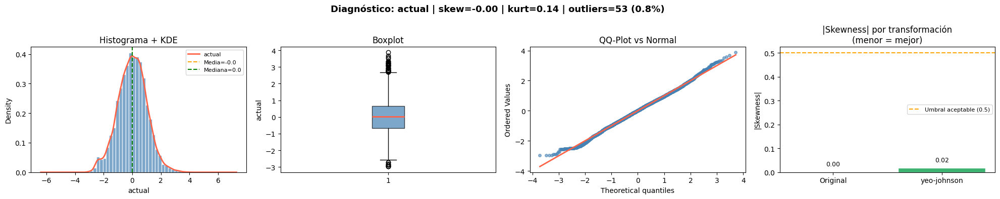


🔍 Columna: 'actual'
   Skewness original : -0.00
   Kurtosis original : 0.14
   Outliers detectados: 53 (0.78%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


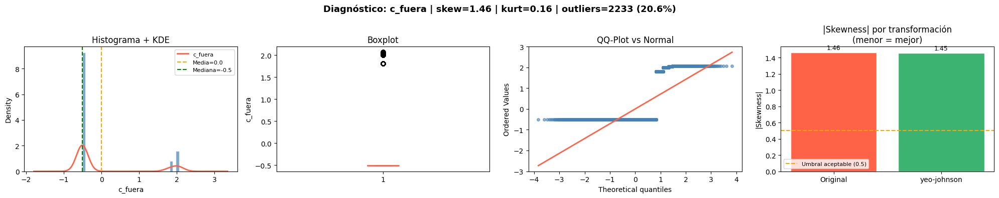


🔍 Columna: 'c_fuera'
   Skewness original : 1.46
   Kurtosis original : 0.16
   Outliers detectados: 2233 (20.60%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


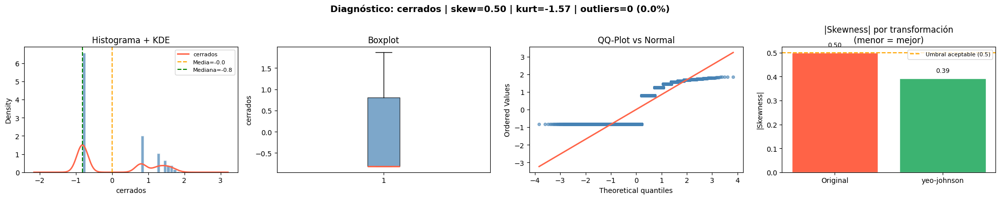


🔍 Columna: 'cerrados'
   Skewness original : 0.50
   Kurtosis original : -1.57
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


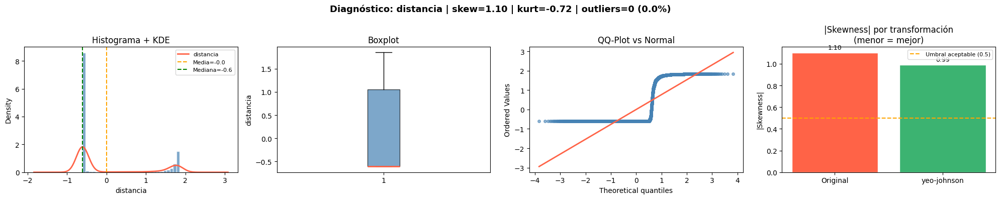


🔍 Columna: 'distancia'
   Skewness original : 1.10
   Kurtosis original : -0.72
   Outliers detectados: 0 (0.00%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


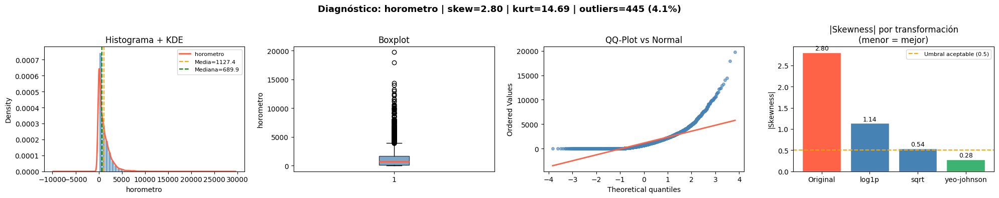


🔍 Columna: 'horometro'
   Skewness original : 2.80
   Kurtosis original : 14.69
   Outliers detectados: 445 (4.10%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


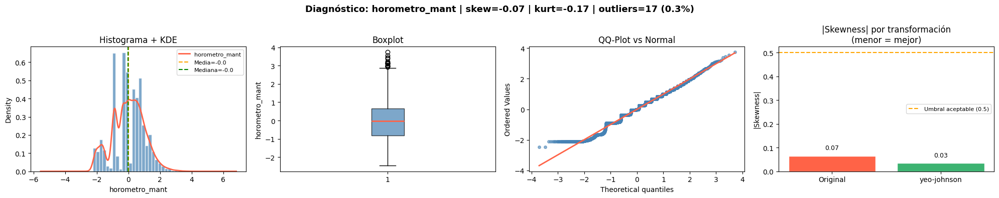


🔍 Columna: 'horometro_mant'
   Skewness original : -0.07
   Kurtosis original : -0.17
   Outliers detectados: 17 (0.25%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


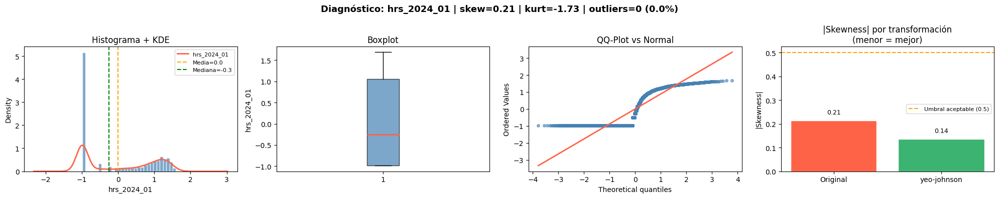


🔍 Columna: 'hrs_2024_01'
   Skewness original : 0.21
   Kurtosis original : -1.73
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


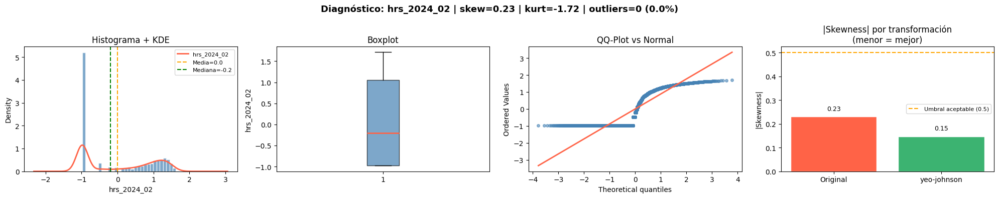


🔍 Columna: 'hrs_2024_02'
   Skewness original : 0.23
   Kurtosis original : -1.72
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


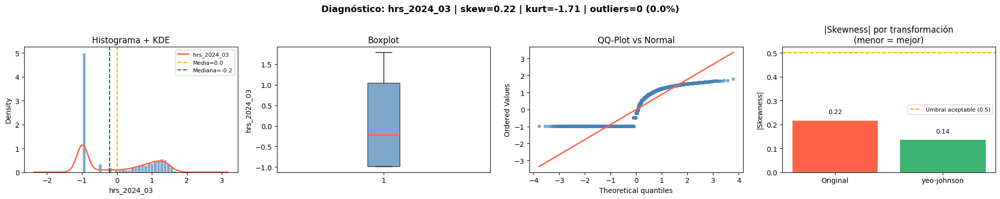


🔍 Columna: 'hrs_2024_03'
   Skewness original : 0.22
   Kurtosis original : -1.71
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


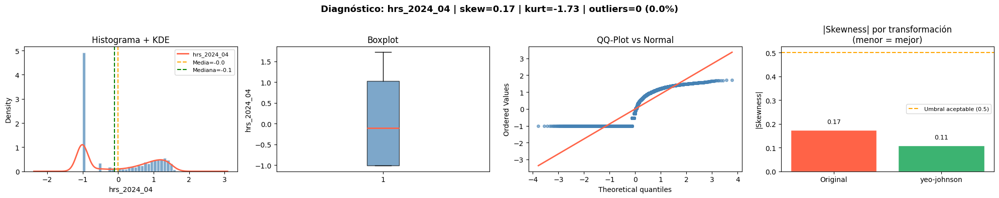


🔍 Columna: 'hrs_2024_04'
   Skewness original : 0.17
   Kurtosis original : -1.73
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


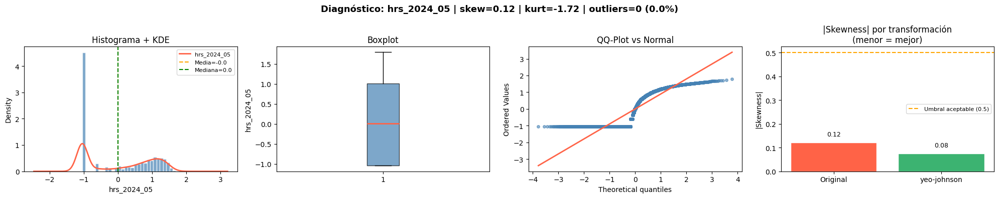


🔍 Columna: 'hrs_2024_05'
   Skewness original : 0.12
   Kurtosis original : -1.72
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


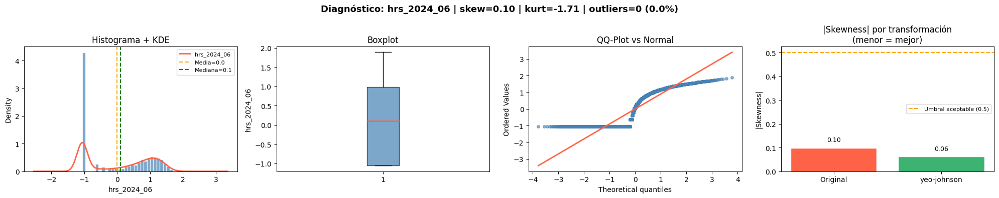


🔍 Columna: 'hrs_2024_06'
   Skewness original : 0.10
   Kurtosis original : -1.71
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


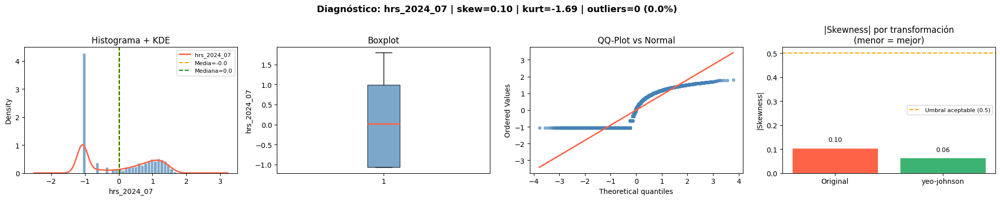


🔍 Columna: 'hrs_2024_07'
   Skewness original : 0.10
   Kurtosis original : -1.69
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


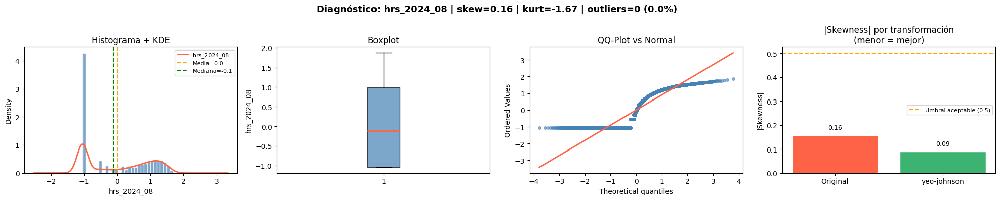


🔍 Columna: 'hrs_2024_08'
   Skewness original : 0.16
   Kurtosis original : -1.67
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


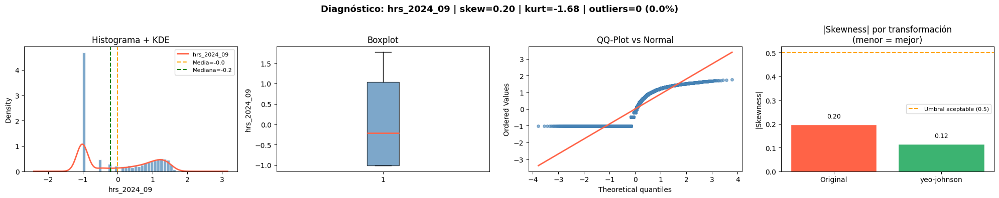


🔍 Columna: 'hrs_2024_09'
   Skewness original : 0.20
   Kurtosis original : -1.68
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


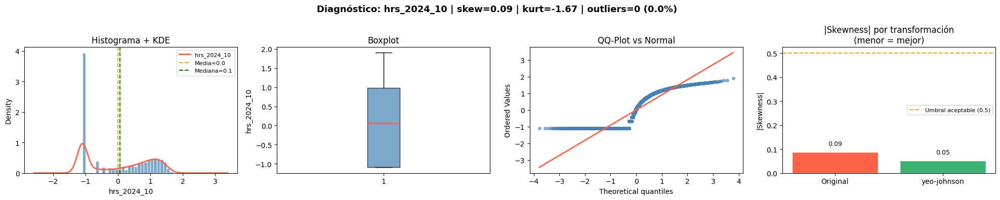


🔍 Columna: 'hrs_2024_10'
   Skewness original : 0.09
   Kurtosis original : -1.67
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


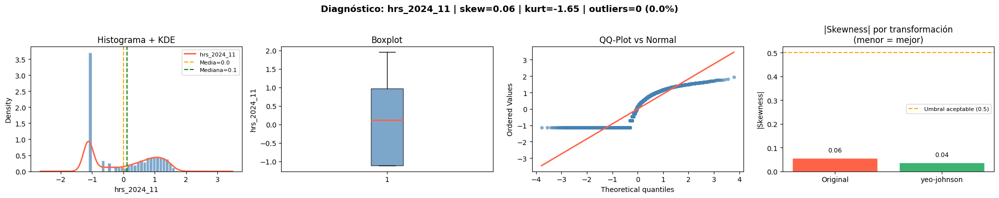


🔍 Columna: 'hrs_2024_11'
   Skewness original : 0.06
   Kurtosis original : -1.65
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


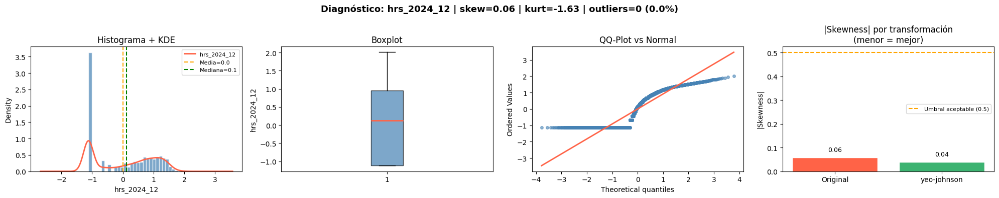


🔍 Columna: 'hrs_2024_12'
   Skewness original : 0.06
   Kurtosis original : -1.63
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


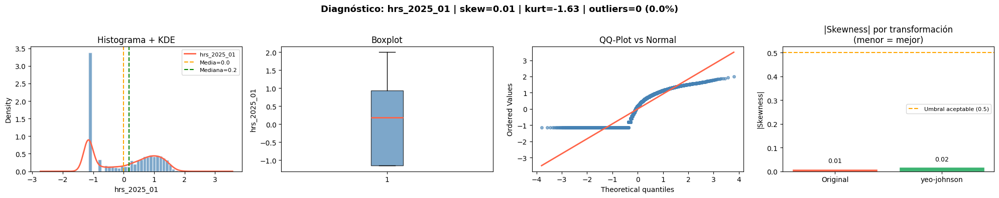


🔍 Columna: 'hrs_2025_01'
   Skewness original : 0.01
   Kurtosis original : -1.63
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


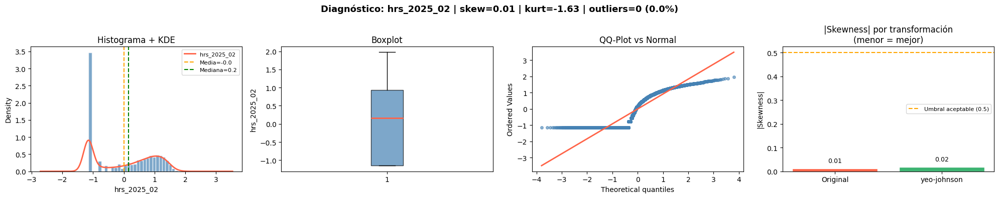


🔍 Columna: 'hrs_2025_02'
   Skewness original : 0.01
   Kurtosis original : -1.63
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


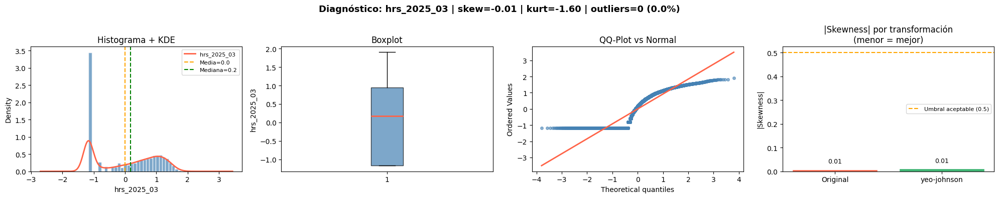


🔍 Columna: 'hrs_2025_03'
   Skewness original : -0.01
   Kurtosis original : -1.60
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


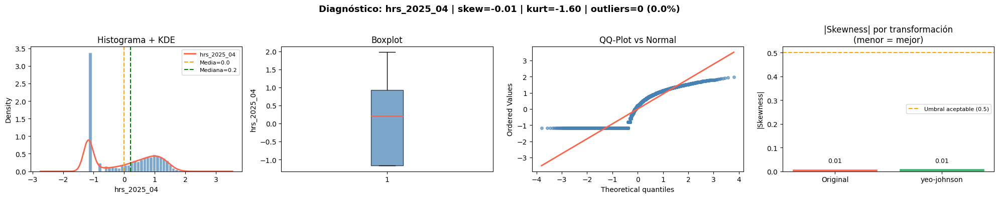


🔍 Columna: 'hrs_2025_04'
   Skewness original : -0.01
   Kurtosis original : -1.60
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


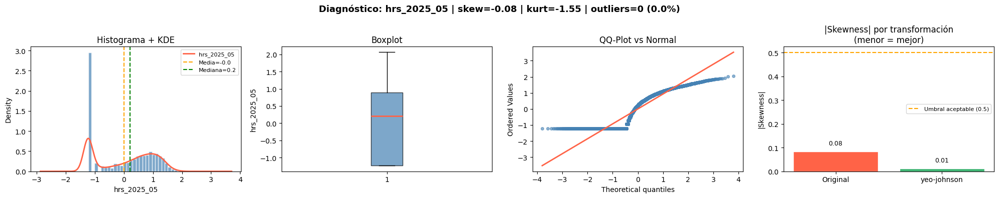


🔍 Columna: 'hrs_2025_05'
   Skewness original : -0.08
   Kurtosis original : -1.55
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


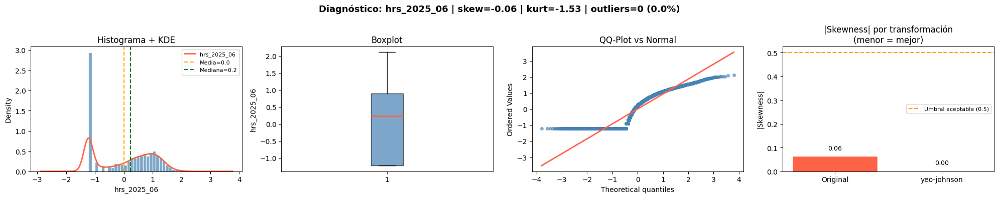


🔍 Columna: 'hrs_2025_06'
   Skewness original : -0.06
   Kurtosis original : -1.53
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


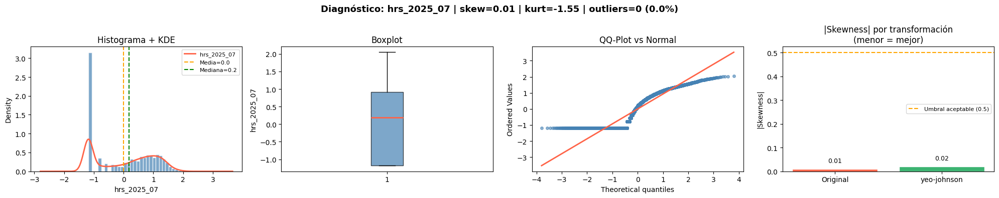


🔍 Columna: 'hrs_2025_07'
   Skewness original : 0.01
   Kurtosis original : -1.55
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


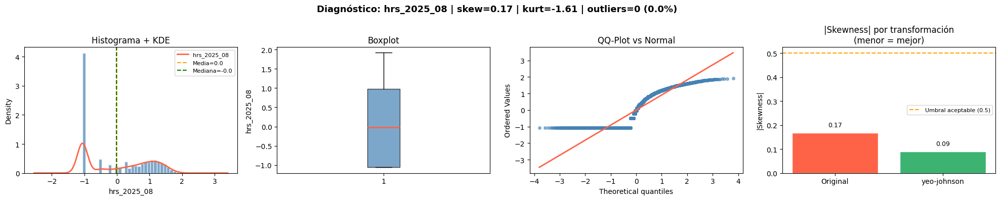


🔍 Columna: 'hrs_2025_08'
   Skewness original : 0.17
   Kurtosis original : -1.61
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


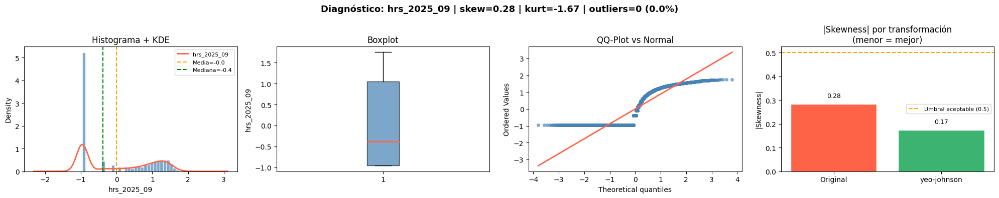


🔍 Columna: 'hrs_2025_09'
   Skewness original : 0.28
   Kurtosis original : -1.67
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


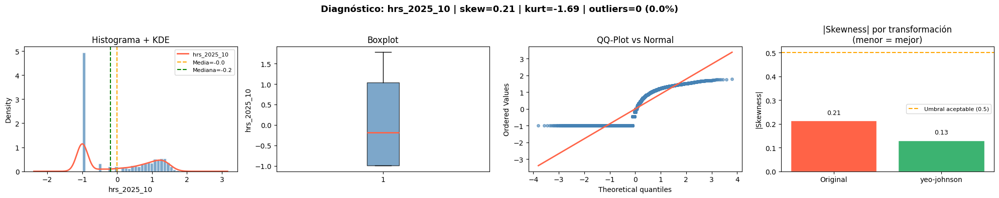


🔍 Columna: 'hrs_2025_10'
   Skewness original : 0.21
   Kurtosis original : -1.69
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


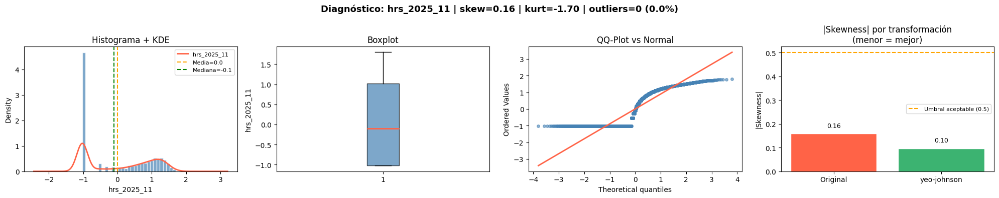


🔍 Columna: 'hrs_2025_11'
   Skewness original : 0.16
   Kurtosis original : -1.70
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


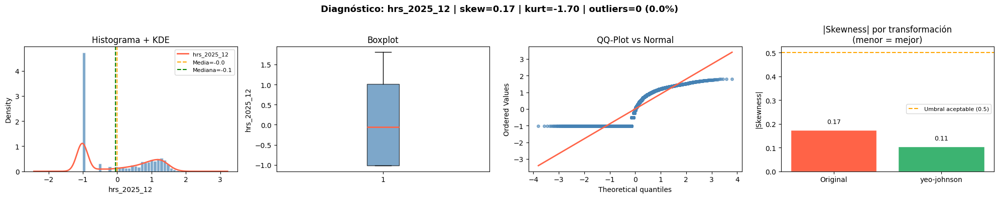


🔍 Columna: 'hrs_2025_12'
   Skewness original : 0.17
   Kurtosis original : -1.70
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


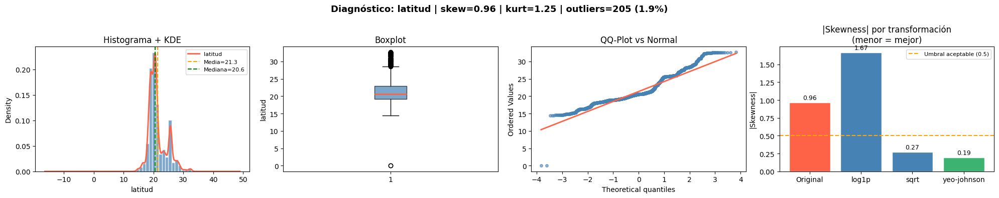


🔍 Columna: 'latitud'
   Skewness original : 0.96
   Kurtosis original : 1.25
   Outliers detectados: 205 (1.93%)
   🟡 Sesgo positivo moderado.
   👉 Transformación recomendada: yeo-johnson
--------------------------------------------------


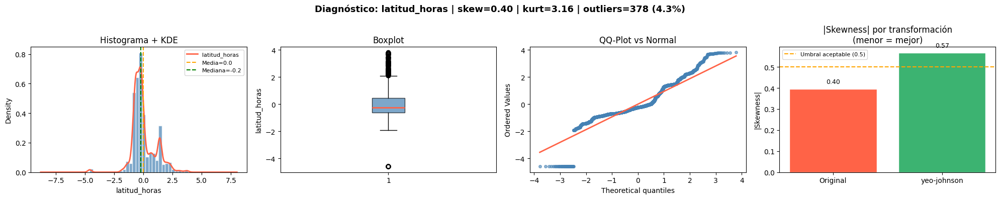


🔍 Columna: 'latitud_horas'
   Skewness original : 0.40
   Kurtosis original : 3.16
   Outliers detectados: 378 (4.26%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


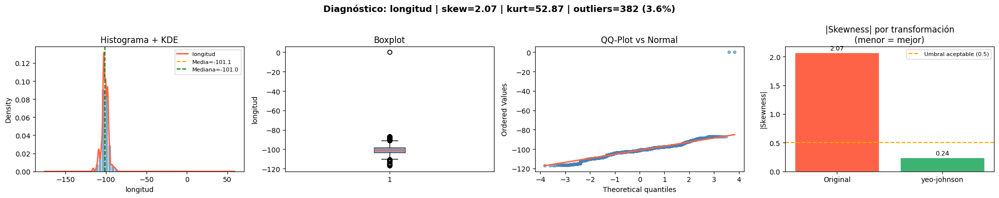


🔍 Columna: 'longitud'
   Skewness original : 2.07
   Kurtosis original : 52.87
   Outliers detectados: 382 (3.60%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


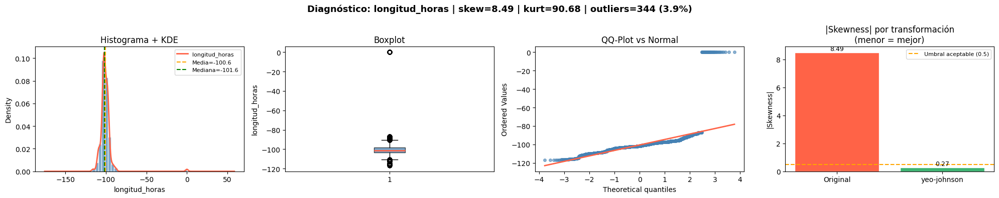


🔍 Columna: 'longitud_horas'
   Skewness original : 8.49
   Kurtosis original : 90.68
   Outliers detectados: 344 (3.88%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


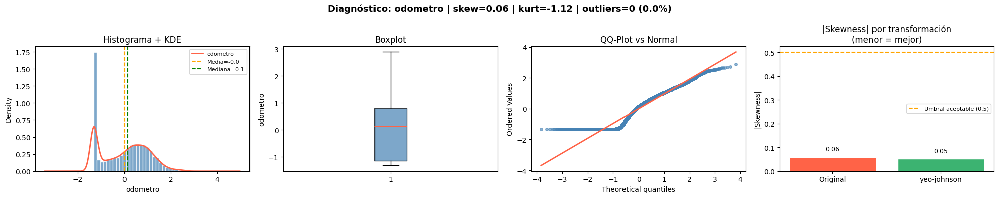


🔍 Columna: 'odometro'
   Skewness original : 0.06
   Kurtosis original : -1.12
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


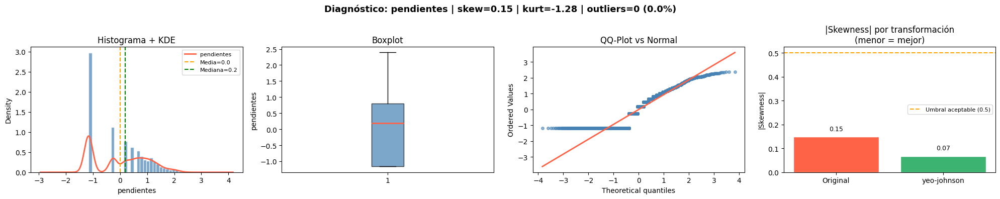


🔍 Columna: 'pendientes'
   Skewness original : 0.15
   Kurtosis original : -1.28
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


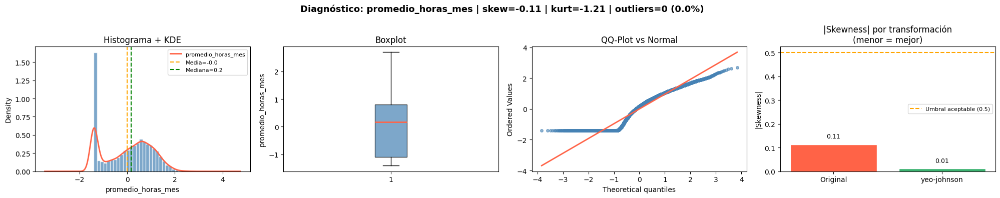


🔍 Columna: 'promedio_horas_mes'
   Skewness original : -0.11
   Kurtosis original : -1.21
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


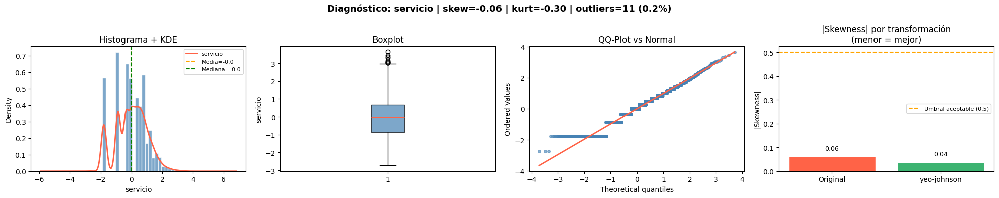


🔍 Columna: 'servicio'
   Skewness original : -0.06
   Kurtosis original : -0.30
   Outliers detectados: 11 (0.16%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


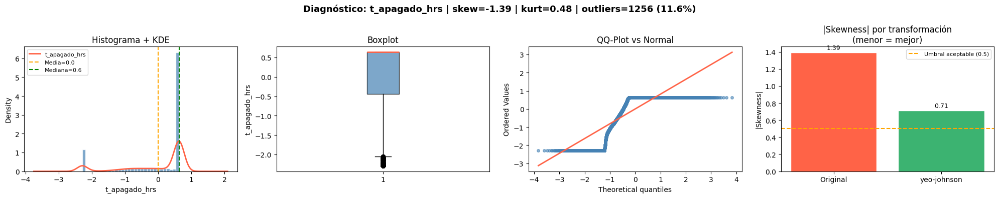


🔍 Columna: 't_apagado_hrs'
   Skewness original : -1.39
   Kurtosis original : 0.48
   Outliers detectados: 1256 (11.58%)
   🔴 Sesgo negativo fuerte — cola larga a la izquierda.
   👉 Transformación recomendada: yeo-johnson
      (Yeo-Johnson suele funcionar mejor para sesgos negativos)
--------------------------------------------------


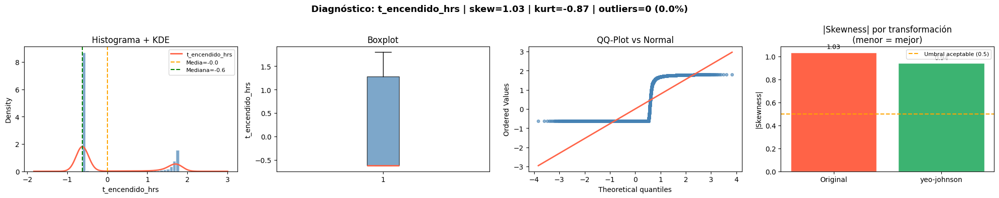


🔍 Columna: 't_encendido_hrs'
   Skewness original : 1.03
   Kurtosis original : -0.87
   Outliers detectados: 0 (0.00%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


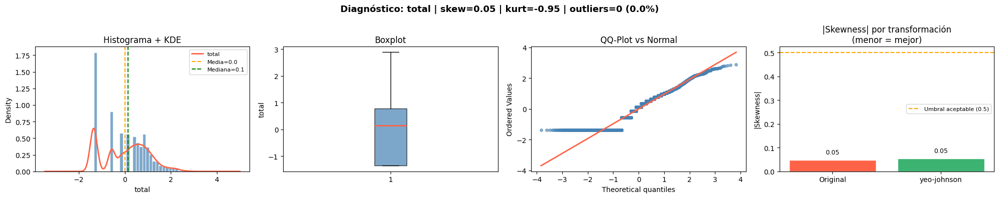


🔍 Columna: 'total'
   Skewness original : 0.05
   Kurtosis original : -0.95
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


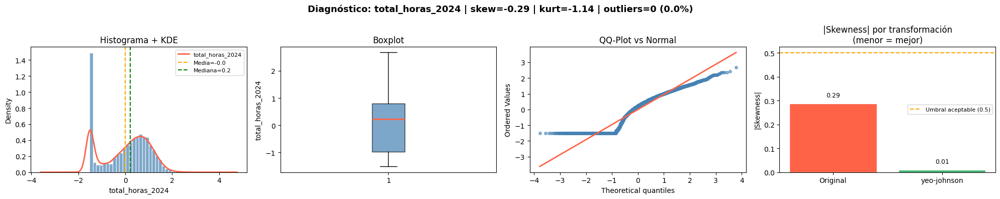


🔍 Columna: 'total_horas_2024'
   Skewness original : -0.29
   Kurtosis original : -1.14
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


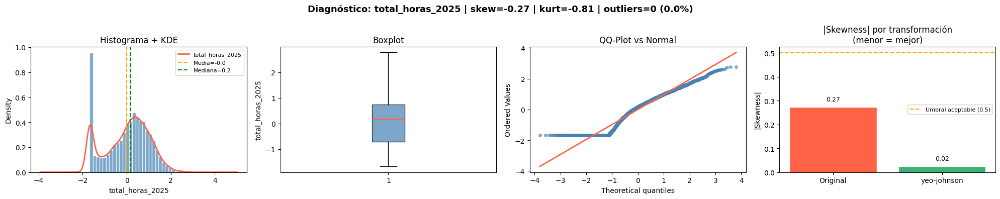


🔍 Columna: 'total_horas_2025'
   Skewness original : -0.27
   Kurtosis original : -0.81
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


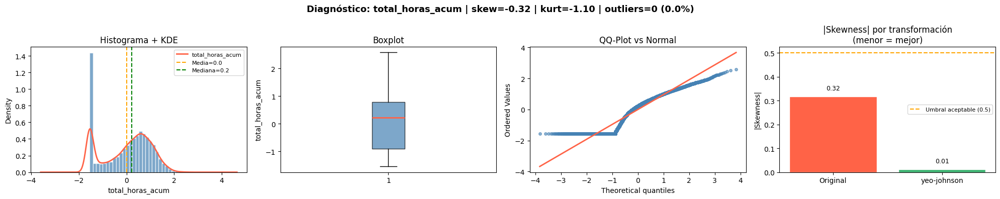


🔍 Columna: 'total_horas_acum'
   Skewness original : -0.32
   Kurtosis original : -1.10
   Outliers detectados: 0 (0.00%)
   ✅ Distribución casi normal, probablemente no necesita transformar los datos.
--------------------------------------------------


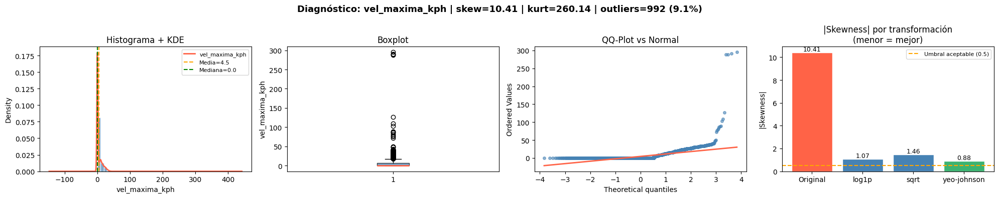


🔍 Columna: 'vel_maxima_kph'
   Skewness original : 10.41
   Kurtosis original : 260.14
   Outliers detectados: 992 (9.15%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------


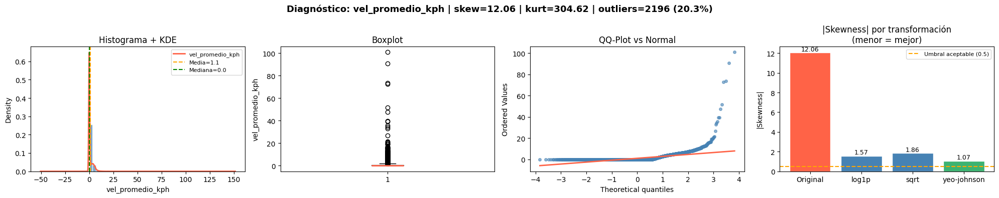


🔍 Columna: 'vel_promedio_kph'
   Skewness original : 12.06
   Kurtosis original : 304.62
   Outliers detectados: 2196 (20.25%)
   🔴 Sesgo positivo fuerte — cola larga a la derecha.
   👉 Transformación recomendada: yeo-johnson
      (considerar también winsorización si hay outliers extremos)
--------------------------------------------------
Columnas graficadas 46 columnas
Columnas: ['actual', 'c_fuera', 'cerrados', 'distancia', 'horometro', 'horometro_mant', 'hrs_2024_01', 'hrs_2024_02', 'hrs_2024_03', 'hrs_2024_04', 'hrs_2024_05', 'hrs_2024_06', 'hrs_2024_07', 'hrs_2024_08', 'hrs_2024_09', 'hrs_2024_10', 'hrs_2024_11', 'hrs_2024_12', 'hrs_2025_01', 'hrs_2025_02', 'hrs_2025_03', 'hrs_2025_04', 'hrs_2025_05', 'hrs_2025_06', 'hrs_2025_07', 'hrs_2025_08', 'hrs_2025_09', 'hrs_2025_10', 'hrs_2025_11', 'hrs_2025_12', 'latitud', 'latitud_horas', 'longitud', 'longitud_horas', 'odometro', 'pendientes', 'promedio_horas_mes', 'servicio', 't_apagado_hrs', 't_encendido_hrs', 'total', 'total_horas_

In [ ]:
diagnostico_transformacion(df_transform)

## **6. Justificación de técnicas aplicadas y comentario de resultados**

---

### **Paso 1 — Integración de dataframes**

Se utilizó `pd.merge()` con estrategias de join diferenciadas según la naturaleza de cada combinación:

- **Horas 2024 + Horas 2025 (`outer`)**: se conservan todas las unidades aunque no aparezcan en ambos años, evitando pérdida de información por ausencias temporales.
- **UnidadesDA + Mantenimientos (`left`)**: se toma UnidadesDA como base para preservar todos los equipos operativos, independientemente de si tienen mantenimientos registrados.
- **df_unid_mant + Horas_unidos (`left`)**: se agrega el historial de horas sin eliminar unidades sin datos de horas.

**Resultado:** Se obtuvo `df_master` como fuente única de análisis. `PopulationView` se mantuvo independiente porque sus VINs no coinciden con los `alias` de las tablas Telematrix, por lo que una unión forzada hubiera generado ruido en los datos.

---

### **Paso 2 — Construcción de nuevas variables (feature engineering)**

Se aplicaron operaciones de agregación con `groupby()` y cálculos vectorizados para construir 6 variables derivadas, cada una vinculada a un constructo latente de la red nomológica del proyecto:

| Variable | Técnica | Constructo |
|---|---|---|
| `total_horas_acum` | Suma de columnas mensuales | C2: Perfil de desgaste operativo |
| `promedio_horas_mes` | División por 24 meses | C2: Intensidad de uso |
| `total_horas_distribuidor` | `groupby` + `sum` | C3: Actividad operativa del distribuidor |
| `horometro_promedio` | `groupby` + `mean` | C2: Nivel de desgaste por marca |
| `total_pendientes` | `groupby` + `sum` | C4: Oportunidad de monetización |
| `conteo_cerrados` | `groupby` + `count` | C1: Propensión de fidelización |

**Resultado:** Estas variables capturan comportamiento operativo que no era observable directamente en los datos crudos, y permiten comparaciones significativas entre distribuidores, marcas y unidades.

---

### **Paso 3 — Discretización / binning**

Se aplicó `pd.cut()` con bordes personalizados a `total_horas_acum` (cardinalidad: 2,112 valores únicos) y `promedio_horas_mes`, ya que su alta cardinalidad las hacía difíciles de interpretar y propensas a sobreajuste en modelos.

Se eligió `pd.cut()` sobre `pd.qcut()` porque los intervalos tienen significado operativo real, definido a partir de referencias de la industria agrícola (Wickham Tractor Co., Quora). Usar `pd.qcut()` hubiera distribuido los datos en cuantiles uniformes, perdiendo el significado de los umbrales de uso.

**Resultado:** Se obtuvieron las variables ordinales `total_horas_acum_bins` y `promedio_horas_mes_bins`, que facilitan la segmentación de flotas y son interpretables por perfiles no técnicos (ej. gerentes de distribuidores).

---

### **Paso 4 — One-Hot Encoding**

Se aplicó `OneHotEncoder` de scikit-learn a las variables `marca`, `distribuidor`, `estado` y `estatus`. Estas columnas son nominales sin orden entre categorías, por lo que un encoding ordinal hubiera introducido relaciones falsas (ej. implicaría que "distribuidor A > distribuidor B").

**Resultado:** Las variables categóricas fueron convertidas a representación binaria compatible con algoritmos de machine learning. El aumento en el número de columnas fue esperado dada la alta cardinalidad de `distribuidor`.

---

### **Paso 5 — Transformación de variables con valores atípicos**

Se construyó la función `diagnostico_transformacion()` para evaluar sistemáticamente la distribución de cada variable continua mediante 4 gráficas: histograma+KDE, boxplot, QQ-plot, porcentaje de  y comparativa de skewness. Se evaluaron cuatro transformaciones por variable:

- **`log1p`** y **`sqrt`**: solo aplicables a valores ≥ 0.
- **Box-Cox**: solo para valores estrictamente positivos.
- **Yeo-Johnson**: la más robusta, acepta ceros y negativos.

Se eligió Yeo-Johnson como transformación de referencia por su aplicabilidad universal. Las transformaciones reducen el sesgo de las distribuciones, lo que mejora los supuestos de normalidad requeridos por modelos estadísticos y algunos algoritmos de ML

**Resultado:** Se identificaron las variables que requieren transformación y la técnica más efectiva para cada una, en lugar de aplicar transformaciones de forma arbitraria.

### **¿Cómo mejoraron estas transformaciones la calidad de los datos para el análisis?**

Las transformaciones aplicadas a lo largo del notebook mejoraron la calidad de los datos en cuatro dimensiones clave:

**1. Integración → datos completos y relacionados**
Antes de la integración, la información estaba dispersa en 5 tablas independientes sin una vista unificada por unidad. Después de los merges, `df_master` permite analizar cada equipo con su historial de horas, estado operativo y registro de mantenimientos en una sola fila. Esto elimina la necesidad de cruzar tablas manualmente y reduce el riesgo de errores de interpretación.

**2. Feature engineering → datos más informativos**
Las variables originales (columnas mensuales de horas, registros de mantenimiento individuales) eran granulares pero poco interpretables de forma directa. Las nuevas variables agregadas (`total_horas_acum`, `promedio_horas_mes`, `total_pendientes`, etc.) condensan esa información en métricas accionables que responden preguntas de negocio concretas: ¿qué tan activa es la flota de cada distribuidor? ¿qué unidades tienen mayor desgaste acumulado?

**3. Binning → reducción de ruido y mayor interpretabilidad**
Variables como `total_horas_acum` con 2,112 valores únicos son difíciles de usar directamente en segmentaciones o visualizaciones. La discretización redujo esa cardinalidad a 5 categorías significativas, facilitando comparaciones entre grupos y reduciendo el impacto de valores extremos aislados en los análisis.

**4. One-Hot Encoding y transformaciones de distribución → compatibilidad con modelos**
El encoding convirtió variables categóricas en representaciones numéricas que los algoritmos de ML pueden procesar sin introducir jerarquías artificiales. Las transformaciones de distribución (Yeo-Johnson, log1p, sqrt) redujeron el sesgo de variables con colas largas, acercando su distribución a la normalidad. Esto mejora directamente el desempeño de modelos sensibles a la distribución de los datos (regresión, clustering basado en distancias, PCA), ya que estos asumen o se benefician de distribuciones simétricas.

**En conjunto**, el pipeline de transformaciones llevó los datos de un estado crudo y fragmentado a un estado estructurado, limpio y listo para modelado, maximizando la información útil disponible para el análisis predictivo del proyecto.

In [ ]:
%%shell
jupyter nbconvert --to html /content/3_Construcción_y_transformación_de_datos.ipynb

[NbConvertApp] Converting notebook /content/3_Construcción_y_transformación_de_datos.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 96 image(s).
[NbConvertApp] Writing 10921100 bytes to /content/3_Construcción_y_transformación_de_datos.html
